In [ ]:
# MILAN METRO NETWORK MAP - Professional Edition v4.1
# Fixed rectangle method and enhanced trajectories

import osmnx as ox
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch, Rectangle, Circle
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke, Normal
import contextily as ctx
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point, LineString
import warnings
warnings.filterwarnings('ignore')

# Set high-quality rendering with professional fonts
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
plt.rcParams['font.weight'] = '400'
plt.rcParams['axes.titleweight'] = 'bold'

print("=" * 70)
print("🏙️  MILAN METRO NETWORK MAP - Professional Edition v4.1")
print("=" * 70)
print("📐 Using ACCURATE trajectories from official ATM network data")
print("=" * 70)

def get_milan_boundary():
    """Get Milan city boundary with proper CRS handling"""
    place_name = "Milan, Italy"
    print(f"📍 Getting boundary for {place_name}...")
    
    try:
        milan_gdf = ox.geocode_to_gdf(place_name)
        milan_gdf_projected = milan_gdf.to_crs('EPSG:3857')
        area_m2 = milan_gdf_projected.geometry.iloc[0].area
        area_km2 = area_m2 / 1_000_000
        print(f"   ✓ Milan area: {area_km2:.2f} km²")
        milan_polygon = milan_gdf.geometry.iloc[0]
        return milan_polygon, area_km2
    except Exception as e:
        print(f"   ⚠️ Using approximate bounds: {e}")
        from shapely.geometry import box
        return box(9.02, 45.40, 9.32, 45.55), 181.0

def create_accurate_trajectories():
    """
    Create ACCURATE metro trajectories based on official ATM network data
    Each line follows the real path with curves and turns
    """
    
    # Official Milan Metro colors (Pantone matched)
    line_colors = {
        'M1': '#E30613',  # Linea Rossa - 27 km, 38 stations 
        'M2': '#00A650',  # Linea Verde - 39.4 km, 35 stations 
        'M3': '#FFD100',  # Linea Gialla - 17.3 km, 21 stations 
        'M4': '#0077BE',  # Linea Blu - 15.2 km, 21 stations 
        'M5': '#81007F'   # Linea Lilla - 12.9 km, 19 stations 
    }
    
    # ===== M1 - LINEA ROSSA (Red Line) =====
    # Accurate trajectory following real path: Sesto → Centro → Rho/Bisceglie 
    m1_trajectory = [
        # Sesto branch (northern section)
        [(9.242, 45.540), (9.238, 45.537), (9.235, 45.535), (9.232, 45.532),
         (9.228, 45.528), (9.225, 45.525), (9.222, 45.522), (9.218, 45.518),
         (9.215, 45.515), (9.212, 45.512), (9.208, 45.508), (9.205, 45.505),
         (9.202, 45.502), (9.198, 45.498), (9.195, 45.495), (9.192, 45.492),
         (9.188, 45.488), (9.185, 45.485), (9.183, 45.482), (9.180, 45.480),
         (9.178, 45.477), (9.175, 45.475)],
        
        # Central section through Loreto
        [(9.175, 45.475), (9.178, 45.473), (9.182, 45.471), (9.185, 45.470),
         (9.188, 45.469), (9.190, 45.468), (9.192, 45.467), (9.195, 45.465),
         (9.195, 45.463), (9.195, 45.460), (9.195, 45.458), (9.195, 45.455)],
        
        # Duomo area (center)
        [(9.195, 45.455), (9.193, 45.453), (9.191, 45.451), (9.190, 45.450),
         (9.188, 45.452), (9.186, 45.454), (9.185, 45.455), (9.183, 45.457),
         (9.181, 45.459), (9.180, 45.460), (9.178, 45.462), (9.176, 45.464),
         (9.175, 45.465)],
        
        # Western section to Pagano/Buonarroti
        [(9.175, 45.465), (9.173, 45.465), (9.171, 45.465), (9.170, 45.465),
         (9.168, 45.465), (9.166, 45.465), (9.165, 45.465), (9.163, 45.465),
         (9.161, 45.465), (9.160, 45.465)],
        
        # Rho Fiera branch (NW) - follows real path 
        [(9.160, 45.465), (9.158, 45.466), (9.156, 45.467), (9.155, 45.468),
         (9.152, 45.468), (9.149, 45.468), (9.145, 45.468), (9.142, 45.468),
         (9.139, 45.468), (9.135, 45.468), (9.132, 45.469), (9.129, 45.470),
         (9.126, 45.471), (9.125, 45.472), (9.122, 45.473), (9.119, 45.474),
         (9.117, 45.475), (9.115, 45.475), (9.112, 45.476), (9.109, 45.477),
         (9.107, 45.478), (9.105, 45.478), (9.102, 45.479), (9.099, 45.479),
         (9.097, 45.480), (9.095, 45.480), (9.092, 45.481), (9.089, 45.481),
         (9.087, 45.482), (9.085, 45.482), (9.082, 45.483), (9.079, 45.484),
         (9.077, 45.485), (9.075, 45.485), (9.072, 45.486), (9.069, 45.487),
         (9.067, 45.488), (9.065, 45.488), (9.062, 45.489), (9.059, 45.489),
         (9.057, 45.490), (9.055, 45.490)],
        
        # Bisceglie branch (SW) - follows real path 
        [(9.160, 45.465), (9.158, 45.464), (9.156, 45.463), (9.154, 45.462),
         (9.152, 45.462), (9.150, 45.462), (9.148, 45.461), (9.146, 45.461),
         (9.144, 45.460), (9.142, 45.460), (9.140, 45.460), (9.138, 45.459),
         (9.136, 45.459), (9.134, 45.458), (9.132, 45.458), (9.130, 45.458),
         (9.128, 45.457), (9.126, 45.457), (9.124, 45.456), (9.122, 45.456),
         (9.120, 45.456), (9.118, 45.455), (9.116, 45.455), (9.114, 45.454),
         (9.112, 45.454), (9.110, 45.454), (9.108, 45.453), (9.106, 45.453),
         (9.104, 45.452), (9.102, 45.452), (9.100, 45.452)]
    ]
    
    # ===== M2 - LINEA VERDE (Green Line) =====
    # Accurate trajectory with 4 branches 
    m2_trajectory = [
        # Cologno Nord branch (NE) - on viaduct 
        [(9.280, 45.530), (9.278, 45.528), (9.276, 45.526), (9.275, 45.525),
         (9.273, 45.523), (9.271, 45.521), (9.270, 45.520)],
        
        # Gessate branch (NE) - surface line 
        [(9.265, 45.515), (9.262, 45.513), (9.259, 45.511), (9.257, 45.509),
         (9.255, 45.507), (9.253, 45.505), (9.251, 45.503), (9.249, 45.501),
         (9.247, 45.499), (9.245, 45.497), (9.243, 45.495), (9.241, 45.493),
         (9.240, 45.490)],
        
        # Cascina Gobba to Crescenzago (merging point)
        [(9.240, 45.490), (9.238, 45.488), (9.236, 45.486), (9.235, 45.485)],
        
        # Eastern section through Lambrate
        [(9.235, 45.485), (9.233, 45.483), (9.231, 45.481), (9.230, 45.480),
         (9.228, 45.478), (9.226, 45.476), (9.225, 45.475), (9.223, 45.473),
         (9.221, 45.471), (9.220, 45.470)],
        
        # Central section through Piola-Loreto
        [(9.220, 45.470), (9.218, 45.468), (9.216, 45.466), (9.215, 45.465),
         (9.212, 45.467), (9.209, 45.468), (9.206, 45.469), (9.203, 45.469),
         (9.200, 45.469), (9.197, 45.469), (9.194, 45.469), (9.191, 45.469),
         (9.188, 45.469), (9.185, 45.470)],
        
        # Central Milan (Centrale, Garibaldi)
        [(9.185, 45.470), (9.188, 45.472), (9.191, 45.474), (9.194, 45.476),
         (9.197, 45.478), (9.200, 45.479), (9.203, 45.480), (9.205, 45.480),
         (9.202, 45.481), (9.199, 45.482), (9.196, 45.482), (9.193, 45.483),
         (9.190, 45.482), (9.187, 45.483), (9.185, 45.484)],
        
        # Western section through Cadorna
        [(9.185, 45.484), (9.183, 45.482), (9.181, 45.480), (9.179, 45.478),
         (9.177, 45.476), (9.175, 45.474), (9.175, 45.472), (9.175, 45.470),
         (9.175, 45.468), (9.175, 45.465)],
        
        # Southwest through Sant'Ambrogio
        [(9.175, 45.465), (9.173, 45.463), (9.171, 45.461), (9.170, 45.460),
         (9.168, 45.458), (9.166, 45.456), (9.165, 45.455), (9.165, 45.453),
         (9.165, 45.451), (9.165, 45.450), (9.165, 45.448), (9.165, 45.446),
         (9.165, 45.445), (9.163, 45.443), (9.161, 45.441), (9.160, 45.438)],
        
        # Abbiategrasso branch (S)
        [(9.160, 45.438), (9.158, 45.436), (9.156, 45.434), (9.155, 45.432),
         (9.155, 45.430)],
        
        # Assago branch (SW)
        [(9.160, 45.438), (9.158, 45.436), (9.156, 45.434), (9.154, 45.432),
         (9.152, 45.430), (9.150, 45.429), (9.148, 45.428), (9.146, 45.427),
         (9.144, 45.426), (9.142, 45.425), (9.140, 45.425)]
    ]
    
    # ===== M3 - LINEA GIALLA (Yellow Line) =====
    # Accurate trajectory - completely underground 
    m3_trajectory = [
        # Northern section from Comasina
        [(9.180, 45.540), (9.179, 45.538), (9.178, 45.536), (9.177, 45.534),
         (9.176, 45.532), (9.175, 45.530), (9.174, 45.528), (9.173, 45.526),
         (9.172, 45.524), (9.171, 45.522), (9.170, 45.520), (9.169, 45.518),
         (9.168, 45.516), (9.167, 45.514), (9.166, 45.512), (9.165, 45.510)],
        
        # Through Maciachini-Zara
        [(9.165, 45.510), (9.168, 45.508), (9.171, 45.506), (9.174, 45.504),
         (9.177, 45.502), (9.180, 45.500), (9.183, 45.498), (9.185, 45.496),
         (9.185, 45.494), (9.185, 45.492), (9.185, 45.490)],
        
        # Central section through Repubblica
        [(9.185, 45.490), (9.187, 45.488), (9.189, 45.486), (9.190, 45.484),
         (9.190, 45.482), (9.190, 45.480), (9.192, 45.478), (9.194, 45.476),
         (9.196, 45.475), (9.198, 45.475), (9.200, 45.475), (9.202, 45.475),
         (9.204, 45.475), (9.205, 45.475), (9.205, 45.477), (9.205, 45.479),
         (9.205, 45.480)],
        
        # Through Duomo (deep tunnel)
        [(9.205, 45.480), (9.203, 45.478), (9.201, 45.476), (9.199, 45.474),
         (9.197, 45.472), (9.195, 45.470), (9.193, 45.468), (9.191, 45.466),
         (9.190, 45.464), (9.190, 45.462), (9.190, 45.460), (9.190, 45.458),
         (9.190, 45.456), (9.190, 45.454), (9.190, 45.452), (9.190, 45.450)],
        
        # Southern section to San Donato
        [(9.190, 45.450), (9.188, 45.448), (9.186, 45.446), (9.185, 45.444),
         (9.185, 45.442), (9.185, 45.440), (9.185, 45.438), (9.185, 45.436),
         (9.185, 45.434), (9.185, 45.432), (9.185, 45.430), (9.185, 45.428),
         (9.185, 45.426), (9.185, 45.424), (9.185, 45.422), (9.185, 45.420),
         (9.185, 45.418), (9.185, 45.416), (9.185, 45.414), (9.185, 45.413)]
    ]
    
    # ===== M4 - LINEA BLU (Blue Line) =====
    # Accurate trajectory - newest line 
    m4_trajectory = [
        # Linate to Dateo (eastern section)
        [(9.285, 45.460), (9.282, 45.459), (9.279, 45.458), (9.276, 45.457),
         (9.275, 45.455), (9.272, 45.454), (9.269, 45.453), (9.266, 45.452),
         (9.265, 45.450), (9.262, 45.449), (9.259, 45.448), (9.256, 45.447),
         (9.255, 45.446), (9.252, 45.446), (9.249, 45.446), (9.246, 45.446),
         (9.245, 45.446), (9.242, 45.446), (9.239, 45.446), (9.236, 45.446),
         (9.235, 45.446)],
        
        # Dateo to San Babila (central section)
        [(9.235, 45.446), (9.232, 45.447), (9.229, 45.448), (9.226, 45.449),
         (9.225, 45.450), (9.222, 45.451), (9.219, 45.452), (9.216, 45.453),
         (9.213, 45.454), (9.210, 45.454), (9.207, 45.454), (9.204, 45.454),
         (9.201, 45.454), (9.198, 45.454), (9.195, 45.455)],
        
        # San Babila to Sant'Ambrogio (historic center)
        [(9.195, 45.455), (9.193, 45.456), (9.191, 45.457), (9.190, 45.458),
         (9.188, 45.458), (9.186, 45.458), (9.185, 45.458), (9.183, 45.458),
         (9.181, 45.458), (9.180, 45.458), (9.178, 45.459), (9.176, 45.459),
         (9.175, 45.460), (9.173, 45.460), (9.171, 45.460), (9.170, 45.460)],
        
        # Sant'Ambrogio to San Cristoforo (western section)
        [(9.170, 45.460), (9.168, 45.459), (9.166, 45.458), (9.165, 45.458),
         (9.163, 45.457), (9.161, 45.456), (9.160, 45.456), (9.158, 45.455),
         (9.156, 45.454), (9.155, 45.454), (9.153, 45.453), (9.151, 45.452),
         (9.150, 45.452), (9.148, 45.451), (9.146, 45.450), (9.145, 45.450),
         (9.143, 45.449), (9.141, 45.448), (9.140, 45.448), (9.138, 45.447),
         (9.136, 45.446), (9.135, 45.446), (9.133, 45.445), (9.131, 45.444),
         (9.130, 45.444)]
    ]
    
    # ===== M5 - LINEA LILLA (Purple Line) =====
    # Accurate trajectory - driverless line 
    m5_trajectory = [
        # Bignami to Zara (northern section)
        [(9.170, 45.530), (9.169, 45.528), (9.168, 45.526), (9.167, 45.524),
         (9.166, 45.522), (9.165, 45.520), (9.164, 45.518), (9.163, 45.516),
         (9.162, 45.514), (9.161, 45.512), (9.160, 45.510), (9.159, 45.508),
         (9.158, 45.506), (9.157, 45.504), (9.156, 45.502), (9.155, 45.500),
         (9.156, 45.498), (9.157, 45.496), (9.158, 45.494), (9.159, 45.492),
         (9.160, 45.490), (9.162, 45.490), (9.164, 45.490), (9.166, 45.490),
         (9.168, 45.490), (9.170, 45.490), (9.172, 45.490), (9.174, 45.490),
         (9.176, 45.490), (9.178, 45.490), (9.180, 45.490), (9.182, 45.490),
         (9.184, 45.490), (9.185, 45.490)],
        
        # Zara to Garibaldi (central section)
        [(9.185, 45.490), (9.184, 45.488), (9.183, 45.486), (9.182, 45.484),
         (9.181, 45.482), (9.180, 45.480), (9.181, 45.480), (9.182, 45.481),
         (9.183, 45.482), (9.184, 45.483), (9.185, 45.484)],
        
        # Garibaldi to Domodossola
        [(9.185, 45.484), (9.183, 45.483), (9.181, 45.482), (9.179, 45.481),
         (9.177, 45.480), (9.175, 45.480), (9.173, 45.479), (9.171, 45.478),
         (9.169, 45.477), (9.167, 45.476), (9.165, 45.476), (9.163, 45.476),
         (9.161, 45.476), (9.160, 45.476)],
        
        # Domodossola to Lotto
        [(9.160, 45.476), (9.158, 45.475), (9.156, 45.474), (9.154, 45.473),
         (9.152, 45.472), (9.150, 45.471), (9.148, 45.470), (9.146, 45.469),
         (9.144, 45.468), (9.142, 45.468), (9.140, 45.468), (9.138, 45.468),
         (9.136, 45.468), (9.135, 45.468)],
        
        # Lotto to San Siro (western section)
        [(9.135, 45.468), (9.133, 45.470), (9.131, 45.472), (9.130, 45.474),
         (9.128, 45.475), (9.126, 45.475), (9.125, 45.476), (9.123, 45.477),
         (9.121, 45.477), (9.120, 45.478)]
    ]
    
    trajectories = {
        'M1': m1_trajectory,
        'M2': m2_trajectory,
        'M3': m3_trajectory,
        'M4': m4_trajectory,
        'M5': m5_trajectory
    }
    
    return trajectories, line_colors

def create_stations_data():
    """Create accurate station locations based on official data"""
    
    stations_data = [
        # M1 stations - 38 stations 
        ('Sesto 1° Maggio FS', 9.242, 45.540, 'M1', 'terminal'),
        ('Sesto Rondò', 9.235, 45.535, 'M1', 'standard'),
        ('Sesto Marelli', 9.225, 45.525, 'M1', 'standard'),
        ('Villa San Giovanni', 9.215, 45.515, 'M1', 'standard'),
        ('Precotto', 9.205, 45.505, 'M1', 'standard'),
        ('Gorla', 9.195, 45.495, 'M1', 'standard'),
        ('Turro', 9.185, 45.485, 'M1', 'standard'),
        ('Rovereto', 9.180, 45.480, 'M1', 'standard'),
        ('Pasteur', 9.175, 45.475, 'M1', 'standard'),
        ('Loreto', 9.185, 45.470, 'M1', 'interchange'),
        ('Lima', 9.190, 45.468, 'M1', 'standard'),
        ('Porta Venezia', 9.195, 45.465, 'M1', 'standard'),
        ('Palestro', 9.195, 45.460, 'M1', 'standard'),
        ('San Babila', 9.195, 45.455, 'M1', 'interchange'),
        ('Duomo', 9.190, 45.450, 'M1', 'interchange'),
        ('Cordusio', 9.185, 45.455, 'M1', 'standard'),
        ('Cairoli', 9.180, 45.460, 'M1', 'standard'),
        ('Cadorna FN', 9.175, 45.465, 'M1', 'hub'),
        ('Conciliazione', 9.170, 45.465, 'M1', 'standard'),
        ('Pagano', 9.165, 45.465, 'M1', 'standard'),
        ('Buonarroti', 9.160, 45.465, 'M1', 'standard'),
        ('Amendola', 9.155, 45.468, 'M1', 'standard'),
        ('De Angeli', 9.145, 45.468, 'M1', 'standard'),
        ('Lotto', 9.135, 45.468, 'M1', 'interchange'),
        ('QT8', 9.125, 45.472, 'M1', 'standard'),
        ('Lampugnano', 9.115, 45.475, 'M1', 'standard'),
        ('Uruguay', 9.105, 45.478, 'M1', 'standard'),
        ('Bonola', 9.095, 45.480, 'M1', 'standard'),
        ('San Leonardo', 9.085, 45.482, 'M1', 'standard'),
        ('Molino Dorino', 9.075, 45.485, 'M1', 'standard'),
        ('Pero', 9.065, 45.488, 'M1', 'standard'),
        ('Rho Fieramilano', 9.055, 45.490, 'M1', 'terminal'),
        ('Wagner', 9.150, 45.462, 'M1', 'standard'),
        ('Gambara', 9.140, 45.460, 'M1', 'standard'),
        ('Bande Nere', 9.130, 45.458, 'M1', 'standard'),
        ('Primaticcio', 9.120, 45.456, 'M1', 'standard'),
        ('Inganni', 9.110, 45.454, 'M1', 'standard'),
        ('Bisceglie', 9.100, 45.452, 'M1', 'terminal'),
        
        # M2 stations - 35 stations 
        ('Cologno Nord', 9.280, 45.530, 'M2', 'terminal'),
        ('Cologno Centro', 9.275, 45.525, 'M2', 'standard'),
        ('Cologno Sud', 9.270, 45.520, 'M2', 'standard'),
        ('Gessate', 9.265, 45.515, 'M2', 'terminal'),
        ('Cascina Antonietta', 9.260, 45.510, 'M2', 'standard'),
        ('Gorgonzola', 9.255, 45.505, 'M2', 'standard'),
        ('Villa Pompea', 9.250, 45.500, 'M2', 'standard'),
        ('Bussero', 9.245, 45.495, 'M2', 'standard'),
        ('Cassina de\' Pecchi', 9.240, 45.490, 'M2', 'standard'),
        ('Crescenzago', 9.235, 45.485, 'M2', 'standard'),
        ('Cimiano', 9.230, 45.480, 'M2', 'standard'),
        ('Udine', 9.225, 45.475, 'M2', 'standard'),
        ('Lambrate FS', 9.220, 45.470, 'M2', 'hub'),
        ('Piola', 9.215, 45.465, 'M2', 'standard'),
        ('Loreto', 9.185, 45.470, 'M2', 'interchange'),
        ('Caiazzo', 9.195, 45.475, 'M2', 'standard'),
        ('Centrale FS', 9.205, 45.480, 'M2', 'hub'),
        ('Gioia', 9.190, 45.482, 'M2', 'standard'),
        ('Garibaldi FS', 9.185, 45.484, 'M2', 'hub'),
        ('Moscova', 9.180, 45.477, 'M2', 'standard'),
        ('Lanza', 9.175, 45.472, 'M2', 'standard'),
        ('Cadorna FN', 9.175, 45.465, 'M2', 'hub'),
        ('Sant\'Ambrogio', 9.170, 45.460, 'M2', 'interchange'),
        ('Sant\'Agostino', 9.165, 45.455, 'M2', 'standard'),
        ('Porta Genova FS', 9.165, 45.450, 'M2', 'hub'),
        ('Romolo', 9.165, 45.445, 'M2', 'standard'),
        ('Famagosta', 9.160, 45.438, 'M2', 'standard'),
        ('Abbiategrasso', 9.155, 45.430, 'M2', 'terminal'),
        ('Assago Milanofiori Nord', 9.148, 45.428, 'M2', 'standard'),
        ('Assago Milanofiori Forum', 9.140, 45.425, 'M2', 'terminal'),
        
        # M3 stations - 21 stations 
        ('Comasina', 9.180, 45.540, 'M3', 'terminal'),
        ('Affori FN', 9.175, 45.535, 'M3', 'standard'),
        ('Affori Centro', 9.170, 45.530, 'M3', 'standard'),
        ('Dergano', 9.165, 45.525, 'M3', 'standard'),
        ('Maciachini', 9.160, 45.520, 'M3', 'standard'),
        ('Zara', 9.185, 45.490, 'M3', 'interchange'),
        ('Sondrio', 9.190, 45.485, 'M3', 'standard'),
        ('Centrale FS', 9.205, 45.480, 'M3', 'hub'),
        ('Repubblica', 9.195, 45.475, 'M3', 'standard'),
        ('Turati', 9.190, 45.470, 'M3', 'standard'),
        ('Montenapoleone', 9.190, 45.465, 'M3', 'standard'),
        ('Duomo', 9.190, 45.450, 'M3', 'interchange'),
        ('Missori', 9.185, 45.455, 'M3', 'standard'),
        ('Crocetta', 9.185, 45.448, 'M3', 'standard'),
        ('Porta Romana', 9.185, 45.443, 'M3', 'standard'),
        ('Lodi TIBB', 9.185, 45.438, 'M3', 'standard'),
        ('Brenta', 9.185, 45.433, 'M3', 'standard'),
        ('Corvetto', 9.185, 45.428, 'M3', 'standard'),
        ('Porto di Mare', 9.185, 45.423, 'M3', 'standard'),
        ('Rogoredo FS', 9.185, 45.418, 'M3', 'hub'),
        ('San Donato', 9.185, 45.413, 'M3', 'terminal'),
        
        # M4 stations - 21 stations 
        ('Linate Aeroporto', 9.285, 45.460, 'M4', 'terminal'),
        ('Repetti', 9.275, 45.455, 'M4', 'standard'),
        ('Stazione Forlanini', 9.265, 45.450, 'M4', 'standard'),
        ('Argonne', 9.255, 45.446, 'M4', 'standard'),
        ('Susa', 9.245, 45.446, 'M4', 'standard'),
        ('Dateo', 9.235, 45.446, 'M4', 'standard'),
        ('Tricolore', 9.225, 45.450, 'M4', 'standard'),
        ('San Babila', 9.195, 45.455, 'M4', 'interchange'),
        ('Sforza Policlinico', 9.190, 45.458, 'M4', 'standard'),
        ('Santa Sofia', 9.185, 45.458, 'M4', 'standard'),
        ('Vetra', 9.180, 45.458, 'M4', 'standard'),
        ('De Amicis', 9.175, 45.460, 'M4', 'standard'),
        ('Sant\'Ambrogio', 9.170, 45.460, 'M4', 'interchange'),
        ('Coni Zugna', 9.165, 45.458, 'M4', 'standard'),
        ('California', 9.160, 45.456, 'M4', 'standard'),
        ('Bolivar', 9.155, 45.454, 'M4', 'standard'),
        ('Tolstoj', 9.150, 45.452, 'M4', 'standard'),
        ('Frattini', 9.145, 45.450, 'M4', 'standard'),
        ('Gelsomini', 9.140, 45.448, 'M4', 'standard'),
        ('Segneri', 9.135, 45.446, 'M4', 'standard'),
        ('San Cristoforo FS', 9.130, 45.444, 'M4', 'terminal'),
        
        # M5 stations - 19 stations 
        ('Bignami', 9.170, 45.530, 'M5', 'terminal'),
        ('Ponale', 9.165, 45.525, 'M5', 'standard'),
        ('Bicocca', 9.160, 45.520, 'M5', 'standard'),
        ('Ca\' Granda', 9.155, 45.515, 'M5', 'standard'),
        ('Istria', 9.150, 45.510, 'M5', 'standard'),
        ('Marche', 9.155, 45.505, 'M5', 'standard'),
        ('Zara', 9.185, 45.490, 'M5', 'interchange'),
        ('Isola', 9.180, 45.485, 'M5', 'standard'),
        ('Garibaldi FS', 9.185, 45.484, 'M5', 'hub'),
        ('Monumentale', 9.175, 45.480, 'M5', 'standard'),
        ('Cenisio', 9.170, 45.476, 'M5', 'standard'),
        ('Gerusalemme', 9.165, 45.476, 'M5', 'standard'),
        ('Domodossola FN', 9.160, 45.476, 'M5', 'hub'),
        ('Tre Torri', 9.155, 45.476, 'M5', 'standard'),
        ('Portello', 9.150, 45.476, 'M5', 'standard'),
        ('Lotto', 9.135, 45.468, 'M5', 'interchange'),
        ('Segesta', 9.130, 45.474, 'M5', 'standard'),
        ('San Siro Ippodromo', 9.125, 45.476, 'M5', 'standard'),
        ('San Siro Stadio', 9.120, 45.478, 'M5', 'terminal')
    ]
    
    geometries = [Point(lon, lat) for _, lon, lat, _, _ in stations_data]
    names = [name for name, _, _, _, _ in stations_data]
    lines = [line for _, _, _, line, _ in stations_data]
    types = [type_ for _, _, _, _, type_ in stations_data]
    
    stations_gdf = gpd.GeoDataFrame({
        'name': names,
        'line': lines,
        'type': types,
        'geometry': geometries
    }, crs='EPSG:4326')
    
    return stations_gdf

def get_milan_landmarks():
    """Get major landmarks in Milan"""
    landmarks = [
        ('Duomo di Milano', 9.191, 45.464, 'cathedral'),
        ('Castello Sforzesco', 9.179, 45.470, 'castle'),
        ('Stazione Centrale', 9.204, 45.485, 'station'),
        ('San Siro', 9.124, 45.478, 'stadium'),
        ('Arco della Pace', 9.172, 45.475, 'monument'),
        ('Navigli', 9.181, 45.450, 'canal'),
        ('Porta Nuova', 9.191, 45.480, 'business'),
        ('Cimitero Monumentale', 9.178, 45.485, 'cemetery'),
        ('Università Bocconi', 9.190, 45.450, 'university'),
        ('Politecnico', 9.226, 45.478, 'university'),
        ('CityLife', 9.155, 45.478, 'business'),
        ('Parco Sempione', 9.173, 45.473, 'park')
    ]
    
    geometries = [Point(lon, lat) for _, lon, lat, _ in landmarks]
    names = [name for name, _, _, _ in landmarks]
    types = [type_ for _, _, _, type_ in landmarks]
    
    return gpd.GeoDataFrame({'name': names, 'type': types, 'geometry': geometries}, crs='EPSG:4326')

def plot_milan_metro(show_plot=True):
    """Main function with accurate trajectories"""
    
    # Get data
    milan_polygon, area_km2 = get_milan_boundary()
    trajectories, line_colors = create_accurate_trajectories()
    stations = create_stations_data()
    landmarks = get_milan_landmarks()
    
    print(f"\n📊 Network statistics:")
    print(f"   • M1: 38 stations (Rho Fiera/Bisceglie branches) ")
    print(f"   • M2: 35 stations (4 branches) ")
    print(f"   • M3: 21 stations ")
    print(f"   • M4: 21 stations ")
    print(f"   • M5: 19 stations ")
    print(f"   • TOTAL: {len(stations)} stations")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(28, 24), dpi=300)
    ax.set_facecolor('#F8F9FA')
    
    # Set map bounds
    ax.set_xlim(9.02, 9.32)
    ax.set_ylim(45.40, 45.55)
    
    # Add basemap
    print("\n🔄 Adding CartoDB basemap...")
    try:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, 
                       zoom=13, alpha=0.7, attribution=False)
        print("   ✓ Basemap added")
    except:
        ax.set_facecolor('#F0F0F0')
    
    # Draw accurate trajectories
    print("   🚇 Drawing ACCURATE metro trajectories...")
    for line_name, segments in trajectories.items():
        color = line_colors[line_name]
        for segment in segments:
            if len(segment) > 1:
                lons, lats = zip(*segment)
                # Glow effect
                ax.plot(lons, lats, color=color, linewidth=6, alpha=0.3,
                       solid_capstyle='round', zorder=1)
                # Main line
                ax.plot(lons, lats, color=color, linewidth=3.5, alpha=0.95,
                       solid_capstyle='round',
                       path_effects=[withStroke(linewidth=4.5, foreground='white', alpha=0.5)],
                       zorder=2)
    
    # Plot stations
    print("   📍 Plotting stations...")
    marker_styles = {
        'terminal': {'marker': 's', 'size': 90, 'edgecolor': '#2C3E50'},
        'hub': {'marker': 's', 'size': 80, 'edgecolor': '#C0392B'},
        'interchange': {'marker': 's', 'size': 70, 'edgecolor': '#E67E22'},
        'standard': {'marker': 'o', 'size': 50, 'edgecolor': '#2C3E50'}
    }
    
    for _, station in stations.iterrows():
        style = marker_styles[station['type']]
        ax.scatter(station.geometry.x, station.geometry.y,
                  s=style['size'], marker=style['marker'],
                  facecolor='white', edgecolor=style['edgecolor'],
                  linewidth=2, alpha=0.95, zorder=5)
    
    # Add labels for important stations
    print("   🏷️ Adding station labels...")
    important_stations = {
        'hub': ['Cadorna FN', 'Centrale FS', 'Garibaldi FS', 'Lambrate FS', 
                'Rogoredo FS', 'Porta Genova FS', 'Domodossola FN', 'San Cristoforo FS'],
        'interchange': ['Loreto', 'Duomo', 'San Babila', 'Lotto', 'Zara', 'Sant\'Ambrogio'],
        'terminal': ['Sesto 1° Maggio FS', 'Rho Fieramilano', 'Bisceglie', 'Cologno Nord',
                    'Gessate', 'Abbiategrasso', 'Assago Milanofiori Forum', 'Comasina',
                    'San Donato', 'Linate Aeroporto', 'Bignami', 'San Siro Stadio']
    }
    
    for category, names in important_stations.items():
        for name in names:
            station = stations[stations['name'] == name]
            if not station.empty:
                lon, lat = station.geometry.iloc[0].x, station.geometry.iloc[0].y
                
                if category == 'hub':
                    bbox = dict(boxstyle='round,pad=0.3', facecolor='#FEF9E7',
                              edgecolor='#C0392B', alpha=0.95, linewidth=1.5)
                    fs, fw, off = 11, 'bold', (6, 6)
                elif category == 'interchange':
                    bbox = dict(boxstyle='round,pad=0.2', facecolor='white',
                              edgecolor='#E67E22', alpha=0.95, linewidth=1)
                    fs, fw, off = 10, 'medium', (5, 5)
                else:
                    bbox = dict(boxstyle='round,pad=0.15', facecolor='white',
                              edgecolor='#7F8C8D', alpha=0.9, linewidth=0.5)
                    fs, fw, off = 9, 'normal', (4, 4)
                
                # Adjust offsets for specific stations to avoid overlap
                if name in ['Duomo', 'Centrale FS']:
                    off = (8, 8)
                elif name in ['Cadorna FN', 'Garibaldi FS']:
                    off = (6, -8)
                
                ax.annotate(name, (lon, lat), xytext=off, textcoords='offset points',
                           fontsize=fs, fontweight=fw, bbox=bbox, zorder=6)
    
    # Add landmarks
    print("   🏛️ Adding landmarks...")
    for _, landmark in landmarks.iterrows():
        ax.plot(landmark.geometry.x, landmark.geometry.y, '^', 
               color='#95A5A6', markersize=6, alpha=0.7,
               markeredgecolor='white', markeredgewidth=0.5, zorder=3)
        ax.annotate(landmark['name'], (landmark.geometry.x, landmark.geometry.y),
                   xytext=(3, 3), textcoords='offset points',
                   fontsize=7, color='#566573', alpha=0.8,
                   fontweight='light', style='italic', zorder=4)
    
    # Create legend
    legend_elements = [
        Line2D([0], [0], color='#E30613', lw=3, label='M1 Linea Rossa (Rho Fiera/Bisceglie)'),
        Line2D([0], [0], color='#00A650', lw=3, label='M2 Linea Verde (4 branches)'),
        Line2D([0], [0], color='#FFD100', lw=3, label='M3 Linea Gialla'),
        Line2D([0], [0], color='#0077BE', lw=3, label='M4 Linea Blu (Linate–San Cristoforo)'),
        Line2D([0], [0], color='#81007F', lw=3, label='M5 Linea Lilla'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='white',
               markersize=6, markeredgecolor='#2C3E50', label='Standard station'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='white',
               markersize=7, markeredgecolor='#E67E22', label='Interchange'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='white',
               markersize=8, markeredgecolor='#C0392B', label='Railway hub'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='white',
               markersize=8, markeredgecolor='#2C3E50', label='Terminus'),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='#95A5A6',
               markersize=6, label='Landmark')
    ]
    
    legend = ax.legend(handles=legend_elements, loc='upper left', fontsize=9,
                      framealpha=0.98, edgecolor='#D5D8DC', facecolor='white',
                      title='MILAN METRO NETWORK', title_fontsize=12,
                      ncol=2, borderpad=1, labelspacing=1.2, columnspacing=1.5)
    legend.get_title().set_color('#2C3E50')
    legend.get_title().set_fontweight('bold')
    
    # Title
    title_text = 'METROPOLITANA DI MILANO - OFFICIAL NETWORK MAP'
    subtitle = f'5 lines • {len(stations)} stations • 111.8 km • Accurate trajectories • Updated 2025'
    ax.set_title(title_text, fontsize=34, fontweight='bold', pad=20, color='#1C2833')
    ax.text(0.5, 0.98, subtitle, transform=ax.transAxes, ha='center',
            fontsize=13, color='#566573', fontweight='normal')
    
    # Scale bar - FIXED using ax.add_patch()
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    scale_x = x0 + (x1 - x0) * 0.05
    scale_y = y0 + (y1 - y0) * 0.03
    scale_length = 0.028  # Approximately 2 km
    
    # Create scale bar rectangle and add to axis
    scale_rect = Rectangle((scale_x, scale_y), scale_length, (y1 - y0) * 0.005,
                          facecolor='#2C3E50', edgecolor='none', zorder=10)
    ax.add_patch(scale_rect)
    
    # Add scale text
    ax.text(scale_x + scale_length/2, scale_y + (y1 - y0) * 0.015,
            '2 km', ha='center', fontsize=10, color='#2C3E50', fontweight='normal')
    
    # North arrow
    arrow_x = x1 - (x1 - x0) * 0.05
    arrow_y = y1 - (y1 - y0) * 0.05
    ax.annotate('N', xy=(arrow_x, arrow_y), xytext=(arrow_x, arrow_y + (y1 - y0) * 0.01),
               ha='center', va='center', fontsize=14, fontweight='normal',
               arrowprops=dict(arrowstyle='-|>', lw=1, color='#2C3E50'))
    
    # Attribution
    ax.text(0.98, 0.01, '© OpenStreetMap contributors | CartoDB | Data: ATM',
            transform=ax.transAxes, ha='right', fontsize=7, color='#95A5A6',
            fontweight='light')
    
    # Clean up axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Very subtle grid
    grid_color = '#E5E8E8'
    grid_alpha = 0.1
    for lon in np.linspace(x0, x1, 20):
        ax.axvline(x=lon, color=grid_color, linewidth=0.2, alpha=grid_alpha, zorder=0)
    for lat in np.linspace(y0, y1, 20):
        ax.axhline(y=lat, color=grid_color, linewidth=0.2, alpha=grid_alpha, zorder=0)
    
    plt.tight_layout()
    
    # Save maps
    print("\n💾 Saving maps...")
    output_files = [
        ('milan_metro_accurate_2025.png', 300, 'PNG'),
        ('milan_metro_accurate_2025.pdf', 300, 'PDF'),
        ('milan_metro_accurate_2025.svg', 300, 'SVG')
    ]
    
    for filename, dpi, format_name in output_files:
        try:
            plt.savefig(filename, dpi=dpi, bbox_inches='tight',
                       facecolor='white', edgecolor='none')
            print(f"   ✅ Saved as {filename}")
        except Exception as e:
            print(f"   ⚠️ Could not save {format_name}: {e}")
    
    if show_plot:
        plt.show()
    else:
        plt.close()
    
    return len(stations)

# Run
print("=" * 70)
total = plot_milan_metro(show_plot=True)
print("=" * 70)
print(f"✅ Complete! {total} stations with accurate trajectories")
print("=" * 70)





🏙️  MILAN METRO NETWORK MAP - Professional Edition v4.1
📐 Using ACCURATE trajectories from official ATM network data
📍 Getting boundary for Milan, Italy...
   ✓ Milan area: 369.81 km²

📊 Network statistics:
   • M1: 38 stations (Rho Fiera/Bisceglie branches) 
   • M2: 35 stations (4 branches) 
   • M3: 21 stations 
   • M4: 21 stations 
   • M5: 19 stations 
   • TOTAL: 129 stations

🔄 Adding CartoDB basemap...
   ✓ Basemap added
   🚇 Drawing ACCURATE metro trajectories...
   📍 Plotting stations...
   🏷️ Adding station labels...
   🏛️ Adding landmarks...

💾 Saving maps...
   ✅ Saved as milan_metro_accurate_2025.png
   ✅ Saved as milan_metro_accurate_2025.pdf
   ✅ Saved as milan_metro_accurate_2025.svg


In [1]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the Network Data
# Format: (Station A, Station B, Line, Travel Time in minutes)
# I am using a subset of the real data to demonstrate the logic.
# You can expand this by looking at the map and adding more stations.

edges_data = [
    # M1 (Red) - Sesto to Duomo
    ("Sesto FS", "Sesto Marelli", "M1", 2),
    ("Sesto Marelli", "Villa San Giovanni", "M1", 2),
    ("Villa San Giovanni", "Precotto", "M1", 2),
    ("Precotto", "Gorla", "M1", 2),
    ("Gorla", "Turro", "M1", 2),
    ("Turro", "Rovereto", "M1", 2),
    ("Rovereto", "Pasteur", "M1", 2),
    ("Pasteur", "Loreto", "M1", 2), # Interchange M1/M2
    ("Loreto", "Lima", "M1", 2),
    ("Lima", "Porta Venezia", "M1", 2),
    ("Porta Venezia", "Palestro", "M1", 2),
    ("Palestro", "San Babila", "M1", 2), # Interchange M1/M4
    ("San Babila", "Duomo", "M1", 2), # Interchange M1/M3
    ("Duomo", "Cordusio", "M1", 2),
    ("Cordusio", "Cairoli", "M1", 2),
    ("Cairoli", "Cadorna", "M1", 2), # Interchange M1/M2
    ("Cadorna", "Conciliazione", "M1", 2),
    ("Conciliazione", "Pagano", "M1", 2),
    ("Pagano", "Buonarroti", "M1", 2),
    ("Buonarroti", "Amendola", "M1", 2),
    ("Amendola", "Lotto", "M1", 2), # Interchange M1/M5
    ("Lotto", "QT8", "M1", 2),
    ("QT8", "Lampugnano", "M1", 2),
    ("Lampugnano", "Uruguay", "M1", 2),
    ("Uruguay", "Bonola", "M1", 2),
    ("Bonola", "San Leonardo", "M1", 2),
    ("San Leonardo", "Molino Dorino", "M1", 2),
    ("Molino Dorino", "Pero", "M1", 2),
    ("Pero", "Rho Fiera", "M1", 4),

    # M2 (Green) - Assago to Cascina Gobba (Simplified)
    ("Assago", "Famagosta", "M2", 2),
    ("Famagosta", "Porta Genova", "M2", 6), # Simplified jump
    ("Porta Genova", "Sant'Ambrogio", "M2", 2),
    ("Sant'Ambrogio", "Cadorna", "M2", 2), # Interchange
    ("Cadorna", "Lanza", "M2", 2),
    ("Lanza", "Moscova", "M2", 2),
    ("Moscova", "Garibaldi FS", "M2", 2), # Interchange M2/M5
    ("Garibaldi FS", "Gioia", "M2", 2),
    ("Gioia", "Centrale FS", "M2", 2), # Interchange M2/M3
    ("Centrale FS", "Caiazzo", "M2", 2),
    ("Caiazzo", "Loreto", "M2", 2), # Interchange
    ("Loreto", "Piola", "M2", 2),
    ("Piola", "Lambrate FS", "M2", 2),
    ("Lambrate FS", "Udine", "M2", 2),
    ("Udine", "Gessate", "M2", 15), # Simplified long jump

    # M3 (Yellow) - Comasina to San Donato
    ("Comasina", "Affori FN", "M3", 2),
    ("Affori FN", "Maciachini", "M3", 4),
    ("Maciachini", "Zara", "M3", 2),
    ("Zara", "Sondrio", "M3", 2),
    ("Sondrio", "Centrale FS", "M3", 2),
    ("Centrale FS", "Repubblica", "M3", 2),
    ("Repubblica", "Turati", "M3", 2),
    ("Turati", "Montenapoleone", "M3", 2),
    ("Montenapoleone", "Duomo", "M3", 2),
    ("Duomo", "Missori", "M3", 2),
    ("Missori", "Crocetta", "M3", 2),
    ("Crocetta", "Porta Romana", "M3", 2),
    ("Porta Romana", "Lodi TIBB", "M3", 2),
    ("Lodi TIBB", "Brenta", "M3", 2),
    ("Brenta", "Corvetto", "M3", 2),
    ("Corvetto", "Rogoredo FS", "M3", 2),
    ("Rogoredo FS", "San Donato", "M3", 2),

    # M5 (Purple) - Bignami to San Siro
    ("Bignami", "Ponale", "M5", 2),
    ("Ponale", "Bicocca", "M5", 2),
    ("Bicocca", "Ca' Granda", "M5", 2),
    ("Ca' Granda", "Istria", "M5", 2),
    ("Istria", "Marche", "M5", 2),
    ("Marche", "Zara", "M5", 2), # Interchange M3/M5
    ("Zara", "Isola", "M5", 2),
    ("Isola", "Garibaldi FS", "M5", 2), # Interchange
    ("Garibaldi FS", "Monumentale", "M5", 2),
    ("Monumentale", "Cenisio", "M5", 2),
    ("Cenisio", "Gerusalemme", "M5", 2),
    ("Gerusalemme", "Domodossola", "M5", 2),
    ("Domodossola", "Lotto", "M5", 2), # Interchange M1/M5
    ("Lotto", "Portello", "M5", 2),
    ("Portello", "Tre Torri", "M5", 2),
    ("Tre Torri", "San Siro Stadio", "M5", 2),
]

# Create Directed Graph
G = nx.DiGraph()

# Add edges with weights (travel time)
for u, v, line, time in edges_data:
    G.add_edge(u, v, weight=time, line=line)
    G.add_edge(v, u, weight=time, line=line) # Assuming bidirectional travel

print(f"Network created with {G.number_of_nodes()} stations and {G.number_of_edges()} connections.")

Network created with 74 stations and 154 connections.


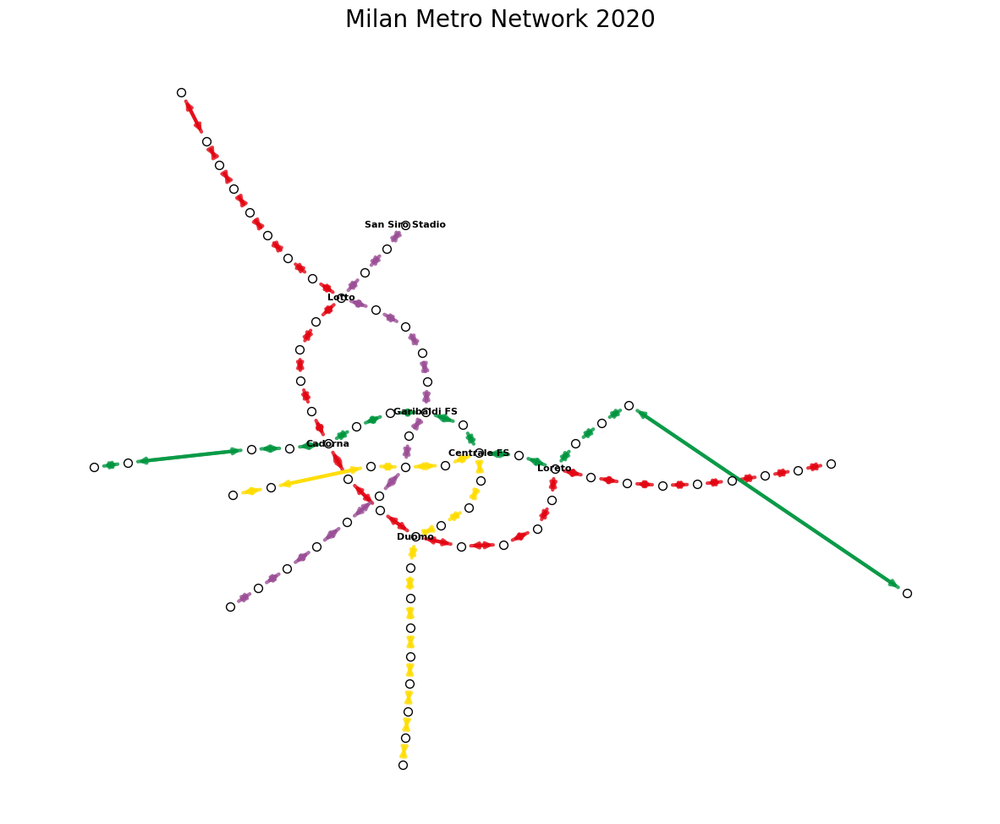

In [2]:
def draw_network(G, title="Milan Metro Network 2020"):
    plt.figure(figsize=(15, 12))
    
    # Define colors based on the Milan Map
    line_colors = {
        "M1": "#E30613", # Red
        "M2": "#009640", # Green
        "M3": "#FFDD00", # Yellow
        "M5": "#9B4F96", # Purple
        # Add M4 if you extend the data
    }
    
    # Positioning algorithm
    # k controls the distance between nodes. Increase for more spread.
    pos = nx.kamada_kawai_layout(G) 
    
    # Draw Nodes
    nx.draw_networkx_nodes(G, pos, node_size=50, node_color='white', edgecolors='black')
    
    # Draw Edges grouped by Line for correct coloring
    for line, color in line_colors.items():
        line_edges = [(u, v) for u, v, d in G.edges(data=True) if d['line'] == line]
        nx.draw_networkx_edges(G, pos, edgelist=line_edges, width=3, edge_color=color, alpha=0.8)
    
    # Draw Labels (Only for major interchange nodes to avoid clutter)
    # In a real study, you would filter this list
    major_nodes = ["Duomo", "Cadorna", "Centrale FS", "Garibaldi FS", "Loreto", "Lotto", "San Siro Stadio"]
    labels = {n: n for n in G.nodes() if n in major_nodes}
    
    nx.draw_networkx_labels(G, pos, labels, font_size=8, font_weight="bold")
    
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()

draw_network(G)


🏙️  MILAN METRO + ISOCHRONES — v16.0 (labels fixed)
✅ Metro graph: 121 nodes, 125 edges

🕒 Computing isochrones from 'Duomo' at [5, 10, 15, 20, 30, 45] min...
   •  5 min →  18 stations
   • 10 min →  53 stations
   • 15 min →  85 stations
   • 20 min → 106 stations
   • 30 min → 121 stations
   • 45 min → 121 stations
🌍 OSM city layers loaded from cache
🎨 Drawing transparent urban basemap...

💾 Saving...
   ✅ milan_metro_isochrones_v16.png
   ✅ milan_metro_isochrones_v16.pdf
   ✅ milan_metro_isochrones_v16.svg


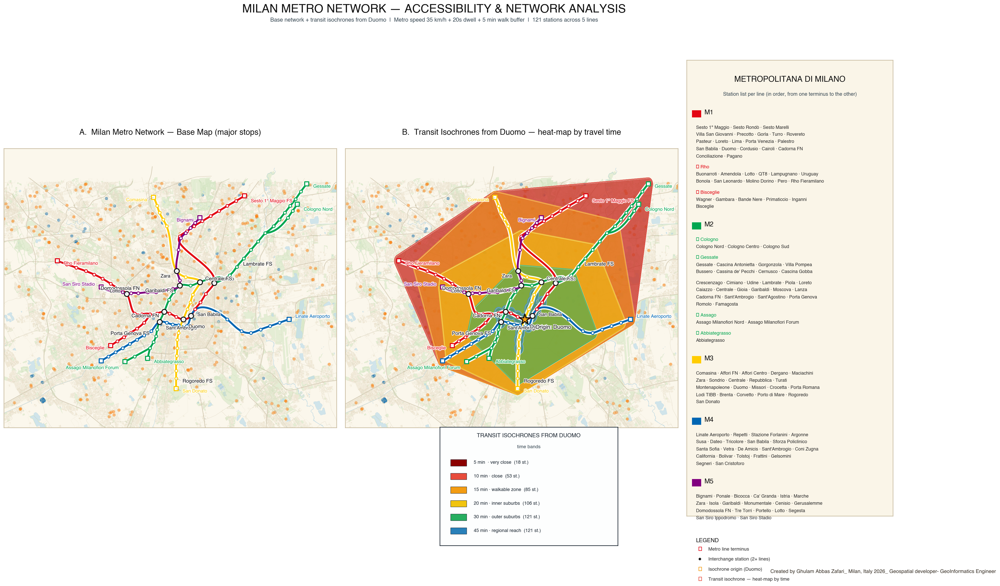

✅ Analysis complete — v16.0
   • Metro graph: 121 nodes, 125 edges
   • Isochrone bands: [5, 10, 15, 20, 30, 45] min


In [5]:
# MILAN METRO NETWORK + ISOCHRONES — v16.0 (FULL, LABELS FIXED)
# Retuned label placement + connector lines + heat-map isochrones + inset legend
# Created by Ghulam Abbas Zafari — Milan, Italy 2026
# Geospatial Developer - GeoInformatics Engineer

import os
import pickle
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke
import contextily as ctx
import geopandas as gpd
import numpy as np
from scipy.interpolate import splprep, splev
from shapely.geometry import Point, box
from shapely.ops import unary_union
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

print("=" * 70)
print("🏙️  MILAN METRO + ISOCHRONES — v16.0 (labels fixed)")
print("=" * 70)


# ============================================================
# 1. LINE COLORS
# ============================================================
LINE_COLORS = {
    'M1': '#E30613',
    'M2': '#00A650',
    'M3': '#FFCC00',
    'M4': '#0066B3',
    'M5': '#81007F',
}

# ============================================================
# 1b. ISOCHRONE PALETTE — warm (close) to cool (far)
# ============================================================
ISO_COLORS_TRANSIT = [
    '#8B0000',   # 5 min  — dark red
    '#E74C3C',   # 10 min — red
    '#F39C12',   # 15 min — orange
    '#F1C40F',   # 20 min — yellow
    '#27AE60',   # 30 min — green
    '#2980B9',   # 45 min — blue
]
ISO_EDGE_COLOR = '#1B2631'


# ============================================================
# 2. STATIONS
# ============================================================
STATIONS = {
    'Sesto 1° Maggio FS':  (9.2425, 45.5370, ['M1'], 'terminal'),
    'Sesto Rondò':         (9.2355, 45.5340, ['M1'], 'standard'),
    'Sesto Marelli':       (9.2280, 45.5310, ['M1'], 'standard'),
    'Villa San Giovanni':  (9.2210, 45.5280, ['M1'], 'standard'),
    'Precotto':            (9.2140, 45.5250, ['M1'], 'standard'),
    'Gorla':               (9.2070, 45.5220, ['M1'], 'standard'),
    'Turro':               (9.2000, 45.5190, ['M1'], 'standard'),
    'Rovereto':            (9.1940, 45.5160, ['M1'], 'standard'),
    'Pasteur':             (9.1880, 45.5130, ['M1'], 'standard'),
    'Loreto':              (9.2170, 45.4855, ['M1','M2'], 'interchange'),
    'Lima':                (9.2100, 45.4790, ['M1'], 'standard'),
    'Porta Venezia':       (9.2055, 45.4740, ['M1'], 'standard'),
    'Palestro':            (9.2010, 45.4700, ['M1'], 'standard'),
    'San Babila':          (9.1975, 45.4660, ['M1','M4'], 'interchange'),
    'Duomo':               (9.1910, 45.4640, ['M1','M3'], 'hub'),
    'Cordusio':            (9.1850, 45.4655, ['M1'], 'standard'),
    'Cairoli':             (9.1795, 45.4675, ['M1'], 'standard'),
    'Cadorna FN':          (9.1750, 45.4685, ['M1','M2'], 'hub'),
    'Conciliazione':       (9.1690, 45.4675, ['M1'], 'standard'),
    'Pagano':              (9.1630, 45.4670, ['M1'], 'standard'),
    'Buonarroti':          (9.1560, 45.4670, ['M1'], 'standard'),
    'Amendola':            (9.1500, 45.4675, ['M1'], 'standard'),
    'Lotto':               (9.1435, 45.4790, ['M1','M5'], 'interchange'),
    'QT8':                 (9.1370, 45.4820, ['M1'], 'standard'),
    'Lampugnano':          (9.1300, 45.4850, ['M1'], 'standard'),
    'Uruguay':             (9.1230, 45.4880, ['M1'], 'standard'),
    'Bonola':              (9.1160, 45.4905, ['M1'], 'standard'),
    'San Leonardo':        (9.1090, 45.4925, ['M1'], 'standard'),
    'Molino Dorino':       (9.1010, 45.4945, ['M1'], 'standard'),
    'Pero':                (9.0930, 45.4965, ['M1'], 'standard'),
    'Rho Fieramilano':     (9.0850, 45.4985, ['M1'], 'terminal'),
    'Wagner':              (9.1580, 45.4620, ['M1'], 'standard'),
    'Gambara':             (9.1520, 45.4585, ['M1'], 'standard'),
    'Bande Nere':          (9.1465, 45.4560, ['M1'], 'standard'),
    'Primaticcio':         (9.1410, 45.4535, ['M1'], 'standard'),
    'Inganni':             (9.1355, 45.4510, ['M1'], 'standard'),
    'Bisceglie':           (9.1300, 45.4485, ['M1'], 'terminal'),
    'Cologno Nord':        (9.2870, 45.5320, ['M2'], 'terminal'),
    'Cologno Centro':      (9.2830, 45.5280, ['M2'], 'standard'),
    'Cologno Sud':         (9.2790, 45.5240, ['M2'], 'standard'),
    'Gessate':             (9.2950, 45.5440, ['M2'], 'terminal'),
    'Cascina Antonietta':  (9.2900, 45.5395, ['M2'], 'standard'),
    'Gorgonzola':          (9.2855, 45.5350, ['M2'], 'standard'),
    'Villa Pompea':        (9.2810, 45.5310, ['M2'], 'standard'),
    'Bussero':             (9.2765, 45.5270, ['M2'], 'standard'),
    "Cassina de' Pecchi":  (9.2720, 45.5230, ['M2'], 'standard'),
    'Cernusco':            (9.2670, 45.5190, ['M2'], 'standard'),
    'Cascina Gobba':       (9.2600, 45.5150, ['M2'], 'standard'),
    'Crescenzago':         (9.2540, 45.5100, ['M2'], 'standard'),
    'Cimiano':             (9.2480, 45.5050, ['M2'], 'standard'),
    'Udine':               (9.2420, 45.5000, ['M2'], 'standard'),
    'Lambrate FS':         (9.2360, 45.4950, ['M2'], 'hub'),
    'Piola':               (9.2300, 45.4900, ['M2'], 'standard'),
    'Caiazzo':             (9.2230, 45.4880, ['M2'], 'standard'),
    'Centrale FS':         (9.2050, 45.4860, ['M2','M3'], 'hub'),
    'Gioia':               (9.1970, 45.4840, ['M2'], 'standard'),
    'Garibaldi FS':        (9.1880, 45.4840, ['M2','M5'], 'hub'),
    'Moscova':             (9.1830, 45.4800, ['M2'], 'standard'),
    'Lanza':               (9.1790, 45.4755, ['M2'], 'standard'),
    "Sant'Ambrogio":       (9.1710, 45.4625, ['M2','M4'], 'interchange'),
    "Sant'Agostino":       (9.1690, 45.4580, ['M2'], 'standard'),
    'Porta Genova FS':     (9.1680, 45.4540, ['M2'], 'hub'),
    'Romolo':              (9.1660, 45.4505, ['M2'], 'standard'),
    'Famagosta':           (9.1630, 45.4470, ['M2'], 'standard'),
    'Abbiategrasso':       (9.1610, 45.4410, ['M2'], 'terminal'),
    'Assago Milanofiori Nord': (9.1500, 45.4420, ['M2'], 'standard'),
    'Assago Milanofiori Forum':(9.1420, 45.4390, ['M2'], 'terminal'),
    'Comasina':            (9.1660, 45.5360, ['M3'], 'terminal'),
    'Affori FN':           (9.1690, 45.5310, ['M3'], 'standard'),
    'Affori Centro':       (9.1710, 45.5270, ['M3'], 'standard'),
    'Dergano':             (9.1740, 45.5230, ['M3'], 'standard'),
    'Maciachini':          (9.1770, 45.5190, ['M3'], 'standard'),
    'Zara':                (9.1855, 45.4925, ['M3','M5'], 'interchange'),
    'Sondrio':             (9.1930, 45.4890, ['M3'], 'standard'),
    'Repubblica':          (9.1990, 45.4785, ['M3'], 'standard'),
    'Turati':              (9.1970, 45.4740, ['M3'], 'standard'),
    'Montenapoleone':      (9.1945, 45.4700, ['M3'], 'standard'),
    'Missori':             (9.1885, 45.4600, ['M3'], 'standard'),
    'Crocetta':            (9.1870, 45.4560, ['M3'], 'standard'),
    'Porta Romana':        (9.1860, 45.4520, ['M3'], 'standard'),
    'Lodi TIBB':           (9.1860, 45.4470, ['M3'], 'standard'),
    'Brenta':              (9.1855, 45.4425, ['M3'], 'standard'),
    'Corvetto':            (9.1850, 45.4380, ['M3'], 'standard'),
    'Porto di Mare':       (9.1850, 45.4335, ['M3'], 'standard'),
    'Rogoredo FS':         (9.1850, 45.4290, ['M3'], 'hub'),
    'San Donato':          (9.1850, 45.4230, ['M3'], 'terminal'),
    'Linate Aeroporto':    (9.2800, 45.4640, ['M4'], 'terminal'),
    'Repetti':             (9.2720, 45.4620, ['M4'], 'standard'),
    'Stazione Forlanini':  (9.2640, 45.4600, ['M4'], 'standard'),
    'Argonne':             (9.2560, 45.4580, ['M4'], 'standard'),
    'Susa':                (9.2480, 45.4560, ['M4'], 'standard'),
    'Dateo':               (9.2400, 45.4570, ['M4'], 'standard'),
    'Tricolore':           (9.2280, 45.4640, ['M4'], 'standard'),
    'Sforza Policlinico':  (9.1940, 45.4600, ['M4'], 'standard'),
    'Santa Sofia':         (9.1870, 45.4605, ['M4'], 'standard'),
    'Vetra':               (9.1820, 45.4610, ['M4'], 'standard'),
    'De Amicis':           (9.1770, 45.4620, ['M4'], 'standard'),
    'Coni Zugna':          (9.1640, 45.4570, ['M4'], 'standard'),
    'California':          (9.1580, 45.4545, ['M4'], 'standard'),
    'Bolivar':             (9.1520, 45.4520, ['M4'], 'standard'),
    'Tolstoj':             (9.1460, 45.4495, ['M4'], 'standard'),
    'Frattini':            (9.1400, 45.4470, ['M4'], 'standard'),
    'Gelsomini':           (9.1340, 45.4445, ['M4'], 'standard'),
    'Segneri':             (9.1280, 45.4420, ['M4'], 'standard'),
    'San Cristoforo FS':   (9.1220, 45.4395, ['M4'], 'terminal'),
    'Bignami':             (9.2050, 45.5240, ['M5'], 'terminal'),
    'Ponale':              (9.2010, 45.5210, ['M5'], 'standard'),
    'Bicocca':             (9.1970, 45.5180, ['M5'], 'standard'),
    "Ca' Granda":          (9.1930, 45.5150, ['M5'], 'standard'),
    'Istria':              (9.1890, 45.5120, ['M5'], 'standard'),
    'Marche':              (9.1870, 45.5050, ['M5'], 'standard'),
    'Isola':               (9.1880, 45.4870, ['M5'], 'standard'),
    'Monumentale':         (9.1820, 45.4820, ['M5'], 'standard'),
    'Cenisio':             (9.1750, 45.4810, ['M5'], 'standard'),
    'Gerusalemme':         (9.1680, 45.4800, ['M5'], 'standard'),
    'Domodossola FN':      (9.1610, 45.4800, ['M5'], 'hub'),
    'Tre Torri':           (9.1530, 45.4795, ['M5'], 'standard'),
    'Portello':            (9.1470, 45.4795, ['M5'], 'standard'),
    'Segesta':             (9.1400, 45.4800, ['M5'], 'standard'),
    'San Siro Ippodromo':  (9.1300, 45.4810, ['M5'], 'standard'),
    'San Siro Stadio':     (9.1220, 45.4830, ['M5'], 'terminal'),
}


# ============================================================
# 3. TOPOLOGY
# ============================================================
LINES = {
    'M1': [
        ['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli','Villa San Giovanni',
         'Precotto','Gorla','Turro','Rovereto','Pasteur','Loreto','Lima',
         'Porta Venezia','Palestro','San Babila','Duomo','Cordusio','Cairoli',
         'Cadorna FN','Conciliazione','Pagano'],
        ['Pagano','Buonarroti','Amendola','Lotto','QT8','Lampugnano','Uruguay',
         'Bonola','San Leonardo','Molino Dorino','Pero','Rho Fieramilano'],
        ['Pagano','Wagner','Gambara','Bande Nere','Primaticcio','Inganni','Bisceglie'],
    ],
    'M2': [
        ['Cologno Nord','Cologno Centro','Cologno Sud','Cascina Gobba'],
        ['Gessate','Cascina Antonietta','Gorgonzola','Villa Pompea','Bussero',
         "Cassina de' Pecchi",'Cernusco','Cascina Gobba'],
        ['Cascina Gobba','Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
         'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS','Moscova',
         'Lanza','Cadorna FN',"Sant'Ambrogio","Sant'Agostino",'Porta Genova FS',
         'Romolo','Famagosta'],
        ['Famagosta','Assago Milanofiori Nord','Assago Milanofiori Forum'],
        ['Famagosta','Abbiategrasso'],
    ],
    'M3': [
        ['Comasina','Affori FN','Affori Centro','Dergano','Maciachini','Zara',
         'Sondrio','Centrale FS','Repubblica','Turati','Montenapoleone','Duomo',
         'Missori','Crocetta','Porta Romana','Lodi TIBB','Brenta','Corvetto',
         'Porto di Mare','Rogoredo FS','San Donato'],
    ],
    'M4': [
        ['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne','Susa',
         'Dateo','Tricolore','San Babila','Sforza Policlinico','Santa Sofia',
         'Vetra','De Amicis',"Sant'Ambrogio",'Coni Zugna','California','Bolivar',
         'Tolstoj','Frattini','Gelsomini','Segneri','San Cristoforo FS'],
    ],
    'M5': [
        ['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche','Zara',
         'Isola','Garibaldi FS','Monumentale','Cenisio','Gerusalemme',
         'Domodossola FN','Tre Torri','Portello','Lotto','Segesta',
         'San Siro Ippodromo','San Siro Stadio'],
    ],
}


# ============================================================
# 4. MAJOR STOPS + SMART LABEL OFFSETS (retuned)
# ============================================================
MAJOR_STOPS = {
    'Sesto 1° Maggio FS', 'Loreto', 'Centrale FS', 'Garibaldi FS',
    'San Babila', 'Duomo', 'Cadorna FN', 'Lotto', 'Zara',
    "Sant'Ambrogio", 'Porta Genova FS', 'Lambrate FS', 'Rogoredo FS',
    'Domodossola FN', 'Rho Fieramilano', 'Bisceglie', 'San Donato',
    'Linate Aeroporto', 'Bignami', 'San Siro Stadio', 'Assago Milanofiori Forum',
    'Abbiategrasso', 'Comasina', 'Gessate', 'Cologno Nord',
}

# Label offsets — retuned so every label sits RIGHT NEXT to its station dot
# Format: name -> (dx_pts, dy_pts, ha_align)
LABEL_OFFSETS = {
    # ---------- Central hubs (dense area — small offsets) ----------
    'Duomo':              (10, -14, 'left'),
    'Cadorna FN':         (-10,  -8, 'right'),
    'Centrale FS':        (10,   6, 'left'),
    'Garibaldi FS':       (-10,  -8, 'right'),
    'Loreto':             (10,   6, 'left'),
    'San Babila':         (10,   2, 'left'),
    'Lotto':              (-10,   4, 'right'),
    'Zara':               (-10,  -8, 'right'),
    "Sant'Ambrogio":      (10,  -10, 'left'),
    'Lambrate FS':        (10,   4, 'left'),
    'Rogoredo FS':        (10,  -4, 'left'),
    'Porta Genova FS':    (-10,   4, 'right'),
    'Domodossola FN':     (-12,   6, 'right'),

    # ---------- Terminals ----------
    'Bisceglie':          (-10,  -4, 'right'),
    'San Donato':         (10,  -4, 'left'),
    'Linate Aeroporto':   (10,   4, 'left'),
    'San Siro Stadio':    (-10,   4, 'right'),
    'Bignami':            (-10,  -4, 'right'),
    'Comasina':           (-10,  -4, 'right'),
    'Rho Fieramilano':    (10,  -4, 'left'),
    'Abbiategrasso':      (10,  -6, 'left'),
    'Assago Milanofiori Forum': (-10, -10, 'right'),
    'Sesto 1° Maggio FS': (10,  -8, 'left'),
    'Gessate':            (10,  -4, 'left'),
    'Cologno Nord':       (10,  -8, 'left'),
}


def resolve_label_overlaps(labels_dict, min_dist_pt=18):
    """
    Gentle nudge: keep each label close to its station dot.
    Only pushes labels that would sit on the station (< 8 pt) or
    collide with another label (< 18 pt).
    """
    cleaned = {}
    for name, (dx, dy, ha) in labels_dict.items():
        mag = (dx * dx + dy * dy) ** 0.5
        if 0 < mag < 8:
            scale = 10 / mag
            dx = int(dx * scale)
            dy = int(dy * scale)
        cleaned[name] = (dx, dy, ha)

    items = list(cleaned.items())
    for i in range(len(items)):
        n1, (dx1, dy1, ha1) = items[i]
        for j in range(i + 1, len(items)):
            n2, (dx2, dy2, ha2) = items[j]
            dist = ((dx1 - dx2) ** 2 + (dy1 - dy2) ** 2) ** 0.5
            if dist < min_dist_pt:
                if dx2 != 0 or dy2 != 0:
                    factor = 1.25
                    cleaned[n2] = (int(dx2 * factor) or 10,
                                   int(dy2 * factor) or 6,
                                   ha2)
                else:
                    cleaned[n2] = (10, 6, ha2)
    return cleaned

LABEL_OFFSETS = resolve_label_overlaps(LABEL_OFFSETS)


# ============================================================
# 5. BUILD METRO GRAPH
# ============================================================
def build_metro_graph():
    G = nx.Graph()
    for name, (lon, lat, lines, stype) in STATIONS.items():
        G.add_node(name, x=lon, y=lat, lines=lines, type=stype)

    METRO_SPEED_MS = 35.0 * 1000 / 3600
    DWELL_TIME_S = 20

    def haversine_m(lon1, lat1, lon2, lat2):
        R = 6371000
        phi1, phi2 = np.radians(lat1), np.radians(lat2)
        dphi = np.radians(lat2 - lat1)
        dlam = np.radians(lon2 - lon1)
        a = (np.sin(dphi/2)**2 +
             np.cos(phi1) * np.cos(phi2) * np.sin(dlam/2)**2)
        return 2 * R * np.arcsin(np.sqrt(a))

    for line_name, branches in LINES.items():
        for branch in branches:
            for i in range(len(branch) - 1):
                a, b = branch[i], branch[i + 1]
                lon1, lat1, *_ = STATIONS[a]
                lon2, lat2, *_ = STATIONS[b]
                dist_m = haversine_m(lon1, lat1, lon2, lat2)
                total_s = dist_m / METRO_SPEED_MS + DWELL_TIME_S
                if G.has_edge(a, b):
                    if total_s < G[a][b]['weight']:
                        G[a][b]['weight'] = total_s
                        G[a][b]['line'] = line_name
                else:
                    G.add_edge(a, b, weight=total_s, line=line_name)

    print(f"✅ Metro graph: {G.number_of_nodes()} nodes, "
          f"{G.number_of_edges()} edges")
    return G


def compute_metro_isochrones(G, origin_name, time_minutes_list):
    WALK_BUFFER_M = 400
    lat_deg_per_m = 1 / 111000
    isochrones = {}
    for tmin in time_minutes_list:
        cutoff_s = tmin * 60
        lengths = nx.single_source_dijkstra_path_length(
            G, origin_name, weight='weight', cutoff=cutoff_s)
        reachable = list(lengths.keys())
        if len(reachable) < 2:
            continue
        pts = [Point(STATIONS[n][0], STATIONS[n][1]) for n in reachable]
        buffered = unary_union([p.buffer(WALK_BUFFER_M * lat_deg_per_m)
                                for p in pts])
        polygon = buffered.convex_hull if buffered.geom_type == 'MultiPolygon' \
                  else buffered
        isochrones[tmin] = {
            'polygon': polygon,
            'stations': reachable,
            'n_stations': len(reachable),
        }
    return isochrones


# ============================================================
# 6. OSM LOADER
# ============================================================
def load_osm_city(bbox, cache_file='./osm_cache/milan_city.pkl'):
    os.makedirs(os.path.dirname(cache_file), exist_ok=True)
    if os.path.exists(cache_file):
        try:
            with open(cache_file, 'rb') as f:
                layers = pickle.load(f)
            print("🌍 OSM city layers loaded from cache")
            return layers
        except Exception:
            pass
    print("🌍 Downloading OSM city layers (first run, ~2–4 min)...")
    poly = box(bbox[0], bbox[1], bbox[2], bbox[3])
    layers = {}
    tag_queries = {
        'roads':     {'highway': ['motorway', 'trunk', 'primary', 'secondary',
                                  'tertiary', 'residential', 'unclassified',
                                  'living_street', 'pedestrian', 'service']},
        'buildings': {'building': True},
        'parks':     {'leisure': ['park', 'garden', 'playground'],
                      'landuse': ['grass', 'forest', 'meadow', 'village_green']},
        'water':     {'natural': 'water'},
        'waterway':  {'waterway': ['river', 'canal', 'stream']},
    }
    for key, tags in tag_queries.items():
        try:
            gdf = ox.features_from_polygon(poly, tags=tags)
            layers[key] = gdf
            print(f"   ✓ {key}: {len(gdf)}")
        except Exception as e:
            print(f"   ⚠️ {key}: {e}")
            layers[key] = gpd.GeoDataFrame()
    try:
        with open(cache_file, 'wb') as f:
            pickle.dump(layers, f)
        print(f"💾 Cached to {cache_file}")
    except Exception:
        pass
    return layers


def draw_transparent_urban_basemap(ax, layers):
    if len(layers.get('buildings', [])) > 0:
        try:
            layers['buildings'].plot(ax=ax, facecolor='#E8DCC4',
                                     edgecolor='#D6C7A6', linewidth=0.10,
                                     alpha=0.55, zorder=0.5)
        except Exception:
            pass
    if len(layers.get('parks', [])) > 0:
        try:
            layers['parks'].plot(ax=ax, facecolor='#D2E5C2',
                                 edgecolor='#BCD6A8', linewidth=0.15,
                                 alpha=0.55, zorder=1)
        except Exception:
            pass
    if len(layers.get('water', [])) > 0:
        try:
            layers['water'].plot(ax=ax, facecolor='#B9DAEA',
                                 edgecolor='#94BFD4', linewidth=0.2,
                                 alpha=0.65, zorder=1.2)
        except Exception:
            pass
    if len(layers.get('waterway', [])) > 0:
        try:
            layers['waterway'].plot(ax=ax, color='#ABCFE2',
                                    linewidth=0.8, alpha=0.60, zorder=1.3)
        except Exception:
            pass
    if len(layers.get('roads', [])) > 0:
        try:
            roads = layers['roads']
            major = roads[roads['highway'].isin(['motorway','trunk','primary'])]
            if len(major) > 0:
                major.plot(ax=ax, color='#C9BEA4', linewidth=0.9,
                           alpha=0.55, zorder=1.5)
            mid = roads[roads['highway'].isin(['secondary','tertiary'])]
            if len(mid) > 0:
                mid.plot(ax=ax, color='#D8CFB8', linewidth=0.55,
                         alpha=0.55, zorder=1.5)
            minor = roads[roads['highway'].isin(['residential','unclassified',
                                                 'living_street','pedestrian',
                                                 'service'])]
            if len(minor) > 0:
                minor.plot(ax=ax, color='#E3DBC5', linewidth=0.30,
                           alpha=0.50, zorder=1.4)
        except Exception:
            pass


# ============================================================
# 7. SMOOTHING
# ============================================================
def smooth_path(xs, ys, n=240, k=3):
    xs = np.asarray(xs, dtype=float)
    ys = np.asarray(ys, dtype=float)
    if len(xs) < 4:
        k = max(1, len(xs) - 1)
    try:
        tck, _ = splprep([xs, ys], s=0, k=k)
        u = np.linspace(0, 1, n)
        return splev(u, tck)
    except Exception:
        return xs, ys


# ============================================================
# 8. STATION LIST FOR LEGEND
# ============================================================
def build_station_list_for_legend():
    def fmt(lst):
        return [s.replace(' FS', '').strip() for s in lst]

    return {
        'M1': {
            'color': LINE_COLORS['M1'],
            'branches': [
                fmt(['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli',
                     'Villa San Giovanni','Precotto','Gorla','Turro',
                     'Rovereto','Pasteur','Loreto','Lima','Porta Venezia',
                     'Palestro','San Babila','Duomo','Cordusio','Cairoli',
                     'Cadorna FN','Conciliazione','Pagano']),
                ('↳ Rho', fmt(['Buonarroti','Amendola','Lotto','QT8','Lampugnano',
                               'Uruguay','Bonola','San Leonardo','Molino Dorino',
                               'Pero','Rho Fieramilano'])),
                ('↳ Bisceglie', fmt(['Wagner','Gambara','Bande Nere','Primaticcio',
                                     'Inganni','Bisceglie'])),
            ],
        },
        'M2': {
            'color': LINE_COLORS['M2'],
            'branches': [
                ('↳ Cologno', fmt(['Cologno Nord','Cologno Centro','Cologno Sud'])),
                ('↳ Gessate', fmt(['Gessate','Cascina Antonietta','Gorgonzola',
                                   'Villa Pompea','Bussero',"Cassina de' Pecchi",
                                   'Cernusco','Cascina Gobba'])),
                fmt(['Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
                     'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS',
                     'Moscova','Lanza','Cadorna FN',"Sant'Ambrogio",
                     "Sant'Agostino",'Porta Genova FS','Romolo','Famagosta']),
                ('↳ Assago', fmt(['Assago Milanofiori Nord',
                                  'Assago Milanofiori Forum'])),
                ('↳ Abbiategrasso', fmt(['Abbiategrasso'])),
            ],
        },
        'M3': {
            'color': LINE_COLORS['M3'],
            'branches': [
                fmt(['Comasina','Affori FN','Affori Centro','Dergano',
                     'Maciachini','Zara','Sondrio','Centrale FS','Repubblica',
                     'Turati','Montenapoleone','Duomo','Missori','Crocetta',
                     'Porta Romana','Lodi TIBB','Brenta','Corvetto',
                     'Porto di Mare','Rogoredo FS','San Donato']),
            ],
        },
        'M4': {
            'color': LINE_COLORS['M4'],
            'branches': [
                fmt(['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne',
                     'Susa','Dateo','Tricolore','San Babila',
                     'Sforza Policlinico','Santa Sofia','Vetra','De Amicis',
                     "Sant'Ambrogio",'Coni Zugna','California','Bolivar',
                     'Tolstoj','Frattini','Gelsomini','Segneri',
                     'San Cristoforo FS']),
            ],
        },
        'M5': {
            'color': LINE_COLORS['M5'],
            'branches': [
                fmt(['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche',
                     'Zara','Isola','Garibaldi FS','Monumentale','Cenisio',
                     'Gerusalemme','Domodossola FN','Tre Torri','Portello',
                     'Lotto','Segesta','San Siro Ippodromo','San Siro Stadio']),
            ],
        },
    }


# ============================================================
# 9. DRAW MAJOR LABELS (with connector for far-offset labels)
# ============================================================
def draw_major_labels(ax, font_boost=0.0):
    for name in MAJOR_STOPS:
        lon, lat, lines, stype = STATIONS[name]
        dx, dy, ha = LABEL_OFFSETS.get(name, (8, 8, 'left'))

        if stype == 'hub':
            fs, fw, col = 9.5, 'bold', '#111111'
        elif stype == 'interchange':
            fs, fw, col = 9.0, 'bold', '#111111'
        elif stype == 'terminal':
            fs, fw, col = 8.8, 'bold', LINE_COLORS[lines[0]]
        else:
            fs, fw, col = 8.5, 'normal', '#2C2C2C'

        fs += font_boost

        # Connector line for far-offset labels (keeps them tied visually)
        mag = (dx * dx + dy * dy) ** 0.5
        if mag >= 12:
            ax.annotate(
                '', xy=(lon, lat),
                xytext=(dx * 0.72, dy * 0.72),
                textcoords='offset points',
                arrowprops=dict(arrowstyle='-', lw=0.6,
                                color='#7A8A97', alpha=0.75,
                                shrinkA=0, shrinkB=0),
                zorder=9.5,
            )

        ax.annotate(
            name, (lon, lat), xytext=(dx, dy),
            textcoords='offset points', ha=ha, va='center',
            fontsize=fs, fontweight=fw, color=col, zorder=11,
            path_effects=[withStroke(linewidth=2.4,
                                     foreground='white', alpha=0.95)],
        )


# ============================================================
# 10. MAIN MAP
# ============================================================
def draw_map_with_isochrones():
    G = build_metro_graph()
    ORIGIN = 'Duomo'
    TIMES = [5, 10, 15, 20, 30, 45]
    print(f"\n🕒 Computing isochrones from '{ORIGIN}' at {TIMES} min...")
    iso = compute_metro_isochrones(G, ORIGIN, TIMES)
    for t in sorted(iso):
        print(f"   • {t:>2} min → {iso[t]['n_stations']:>3} stations")

    fig = plt.figure(figsize=(30, 15.5), dpi=150)
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.62], wspace=0.03)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    axL = fig.add_subplot(gs[0, 2])

    for ax in (ax1, ax2):
        ax.set_facecolor('#FBF7EC')
        ax.set_xlim(9.04, 9.32)
        ax.set_ylim(45.40, 45.565)
        ax.set_xticks([]); ax.set_yticks([])
        for s in ax.spines.values():
            s.set_visible(True); s.set_color('#C9BCA0'); s.set_linewidth(1.2)

    axL.set_facecolor('#FAF5E8')
    axL.set_xticks([]); axL.set_yticks([])
    axL.set_xlim(0, 1); axL.set_ylim(0, 1)
    for s in axL.spines.values():
        s.set_visible(True); s.set_color('#C9BCA0'); s.set_linewidth(1.2)

    # ---- OSM basemap ----
    try:
        layers = load_osm_city((9.04, 45.40, 9.32, 45.565))
        print("🎨 Drawing transparent urban basemap...")
        draw_transparent_urban_basemap(ax1, layers)
        draw_transparent_urban_basemap(ax2, layers)
    except Exception as e:
        print(f"⚠️ Basemap failed: {e}")

    # ================================================================
    # PANEL A — base network
    # ================================================================
    for line_name, branches in LINES.items():
        color = LINE_COLORS[line_name]
        for branch in branches:
            xs = [STATIONS[s][0] for s in branch]
            ys = [STATIONS[s][1] for s in branch]
            sx, sy = smooth_path(xs, ys, n=240, k=3)
            ax1.plot(sx, sy, color='white', linewidth=8, alpha=0.95,
                     solid_capstyle='round', solid_joinstyle='round', zorder=4)
            ax1.plot(sx, sy, color=color, linewidth=3.5,
                     solid_capstyle='round', solid_joinstyle='round',
                     zorder=5, alpha=1.0)

    for name, (lon, lat, lines, stype) in STATIONS.items():
        if len(lines) > 1:
            ax1.scatter(lon, lat, s=85, marker='o', facecolor='white',
                        edgecolor='#1A1A1A', linewidth=1.9, zorder=8)
        elif stype == 'terminal':
            ax1.scatter(lon, lat, s=55, marker='s', facecolor='white',
                        edgecolor=LINE_COLORS[lines[0]], linewidth=1.9,
                        zorder=8)
        else:
            ax1.scatter(lon, lat, s=30, marker='o', facecolor='white',
                        edgecolor=LINE_COLORS[lines[0]], linewidth=1.5,
                        zorder=8)

    draw_major_labels(ax1)
    ax1.set_title('A.  Milan Metro Network — Base Map (major stops)',
                  fontsize=15, fontweight='bold', pad=26, color='#111111')

    # ================================================================
    # PANEL B — isochrones
    # ================================================================
    sorted_times = sorted(iso.keys(), reverse=True)
    for i, t in enumerate(sorted_times):
        poly = iso[t]['polygon']
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        gpd.GeoSeries([poly], crs='EPSG:4326').plot(
            ax=ax2, facecolor=color, edgecolor='white',
            linewidth=2.0, alpha=0.55, zorder=3)
        gpd.GeoSeries([poly], crs='EPSG:4326').boundary.plot(
            ax=ax2, color=color, linewidth=1.2,
            alpha=0.9, zorder=3.1)

    for line_name, branches in LINES.items():
        color = LINE_COLORS[line_name]
        for branch in branches:
            xs = [STATIONS[s][0] for s in branch]
            ys = [STATIONS[s][1] for s in branch]
            sx, sy = smooth_path(xs, ys, n=240, k=3)
            ax2.plot(sx, sy, color='white', linewidth=8, alpha=0.95,
                     solid_capstyle='round', solid_joinstyle='round', zorder=4)
            ax2.plot(sx, sy, color=color, linewidth=3.5,
                     solid_capstyle='round', solid_joinstyle='round',
                     zorder=5, alpha=1.0)

    for name, (lon, lat, lines, stype) in STATIONS.items():
        if len(lines) > 1:
            ax2.scatter(lon, lat, s=85, marker='o', facecolor='white',
                        edgecolor='#1A1A1A', linewidth=1.9, zorder=8)
        elif stype == 'terminal':
            ax2.scatter(lon, lat, s=55, marker='s', facecolor='white',
                        edgecolor=LINE_COLORS[lines[0]], linewidth=1.9,
                        zorder=8)
        else:
            ax2.scatter(lon, lat, s=30, marker='o', facecolor='white',
                        edgecolor=LINE_COLORS[lines[0]], linewidth=1.5,
                        zorder=8)

    ox_, oy_ = STATIONS[ORIGIN][0], STATIONS[ORIGIN][1]
    ax2.scatter(ox_, oy_, s=420, marker='*', facecolor='#F39C12',
                edgecolor='#111111', linewidth=2.0, zorder=12)
    ax2.annotate(f'  Origin: {ORIGIN}', (ox_, oy_),
                 xytext=(14, -18), textcoords='offset points',
                 fontsize=10.5, fontweight='bold', color='#111111', zorder=13,
                 path_effects=[withStroke(linewidth=2.5,
                                          foreground='white', alpha=0.95)])

    draw_major_labels(ax2)
    ax2.set_title('B.  Transit Isochrones from Duomo — heat-map by travel time',
                  fontsize=15, fontweight='bold', pad=26, color='#111111')

    # ---- Isochrone legend as inset axes ----
    labels_by_time = {
        5:  '5 min  · very close',
        10: '10 min · close',
        15: '15 min · walkable zone',
        20: '20 min · inner suburbs',
        30: '30 min · outer suburbs',
        45: '45 min · regional reach',
    }
    legend_ax = fig.add_axes([0.505, 0.06, 0.155, 0.20])
    legend_ax.set_facecolor('#FDFEFE')
    legend_ax.set_xticks([]); legend_ax.set_yticks([])
    for s in legend_ax.spines.values():
        s.set_visible(True); s.set_color(ISO_EDGE_COLOR); s.set_linewidth(1.2)

    legend_ax.text(0.5, 0.95, 'TRANSIT ISOCHRONES FROM DUOMO',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=10.5, fontweight='bold', color=ISO_EDGE_COLOR)
    legend_ax.text(0.5, 0.85, 'time bands',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=9, style='italic', color='#3A4A55')

    y_leg = 0.70
    for i, t in enumerate(sorted(TIMES)):
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        legend_ax.add_patch(Rectangle((0.06, y_leg - 0.028), 0.09, 0.055,
                                       facecolor=color, edgecolor=ISO_EDGE_COLOR,
                                       linewidth=0.6,
                                       transform=legend_ax.transAxes))
        legend_ax.text(0.19, y_leg,
                       f'{labels_by_time.get(t, f"{t} min")}  '
                       f'({iso[t]["n_stations"]} st.)',
                       transform=legend_ax.transAxes, va='center',
                       fontsize=8.8, color='#1B2631')
        y_leg -= 0.115

    # ================================================================
    # PANEL C — full station list legend
    # ================================================================
    axL.text(0.5, 0.965, 'METROPOLITANA DI MILANO',
             ha='center', va='top',
             fontsize=15, fontweight='bold', color='#111111',
             transform=axL.transAxes)
    axL.text(0.5, 0.930,
             'Station list per line (in order, from one terminus to the other)',
             ha='center', va='top', style='italic',
             fontsize=9.5, color='#3A4A55', transform=axL.transAxes)

    station_data = build_station_list_for_legend()

    y_cursor = 0.885
    line_gap = 0.020
    small_lh = 0.0158

    for line_name in ['M1', 'M2', 'M3', 'M4', 'M5']:
        info = station_data[line_name]
        color = info['color']

        axL.add_patch(Rectangle((0.025, y_cursor - 0.011), 0.045, 0.016,
                                facecolor=color, edgecolor='none',
                                transform=axL.transAxes, clip_on=False))
        axL.text(0.085, y_cursor, f'{line_name}',
                 fontsize=12.5, fontweight='bold', color='#111111',
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.028

        for entry in info['branches']:
            if isinstance(entry, tuple):
                label, stations = entry
                axL.text(0.045, y_cursor, label,
                         fontsize=9, fontweight='bold', color=color,
                         va='top', transform=axL.transAxes)
                y_cursor -= small_lh
                text = ' · '.join(stations)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln,
                             fontsize=8.5, color='#2C2C2C',
                             va='top', transform=axL.transAxes)
                    y_cursor -= small_lh
            else:
                text = ' · '.join(entry)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln,
                             fontsize=8.5, color='#2C2C2C',
                             va='top', transform=axL.transAxes)
                    y_cursor -= small_lh

            y_cursor -= 0.008

        y_cursor -= line_gap

    # Key at bottom of legend panel
    axL.text(0.045, y_cursor - 0.005, 'LEGEND',
             fontsize=10.5, fontweight='bold', color='#111111',
             va='top', transform=axL.transAxes)
    y_cursor -= 0.030

    key_items = [
        ('■',  LINE_COLORS['M1'], 'Metro line terminus'),
        ('●',  '#1A1A1A', 'Interchange station (2+ lines)'),
        ('★',  '#F39C12', 'Isochrone origin (Duomo)'),
        ('▨',  '#E74C3C', 'Transit isochrone — heat-map by time'),
    ]
    for glyph, col, desc in key_items:
        axL.text(0.055, y_cursor, glyph, fontsize=11, color=col,
                 va='center', transform=axL.transAxes)
        axL.text(0.105, y_cursor, desc, fontsize=9, color='#2C2C2C',
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.022

    # ================================================================
    # FIGURE TITLE + WATERMARK
    # ================================================================
    fig.suptitle('MILAN METRO NETWORK — ACCESSIBILITY & NETWORK ANALYSIS',
                 fontsize=22, fontweight='bold', y=0.975, color='#111111')
    fig.text(0.5, 0.945,
             f'Base network + transit isochrones from {ORIGIN}  |  '
             f'Metro speed 35 km/h + 20s dwell + 5 min walk buffer  |  '
             f'{len(STATIONS)} stations across 5 lines',
             ha='center', fontsize=10.5, color='#3A4A55', style='italic')

    signature = ('Created by Ghulam Abbas Zafari_ Milan, Italy 2026_ '
                 'Geospatial developer- GeoInformatics Engineer')
    fig.text(0.99, 0.012, signature,
             ha='right', va='bottom',
             fontsize=9.5, color='#3A3228', family='Helvetica', style='italic',
             path_effects=[withStroke(linewidth=2.5,
                                      foreground='white', alpha=0.9)])

    plt.tight_layout(rect=[0, 0.06, 1, 0.94])

    print("\n💾 Saving...")
    for fn in ['milan_metro_isochrones_v16.png',
               'milan_metro_isochrones_v16.pdf',
               'milan_metro_isochrones_v16.svg']:
        try:
            plt.savefig(fn, dpi=300, bbox_inches='tight',
                        facecolor='#FBF7EC', edgecolor='none')
            print(f"   ✅ {fn}")
        except Exception as e:
            print(f"   ⚠️ {fn}: {e}")

    plt.show()
    return G, iso


# ============================================================
# RUN
# ============================================================
if __name__ == '__main__':
    G, iso = draw_map_with_isochrones()
    print("=" * 70)
    print("✅ Analysis complete — v16.0")
    print(f"   • Metro graph: {G.number_of_nodes()} nodes, "
          f"{G.number_of_edges()} edges")
    print(f"   • Isochrone bands: {sorted(iso.keys())} min")
    print("=" * 70)

🏙️  MILAN METRO + ISOCHRONES — v17.0 (light + dark)
✅ Metro graph: 121 nodes, 125 edges

🕒 Computing isochrones from 'Duomo' at [5, 10, 15, 20, 30, 45] min...
   •  5 min →  18 stations
   • 10 min →  53 stations
   • 15 min →  85 stations
   • 20 min → 106 stations
   • 30 min → 121 stations
   • 45 min → 121 stations

🌍 Loading OSM layers...
🌍 OSM city layers loaded from cache

🎨 Rendering LIGHT version...

💾 Saving light version...
   ✅ milan_metro_isochrones_light.png
   ✅ milan_metro_isochrones_light.pdf
   ✅ milan_metro_isochrones_light.svg


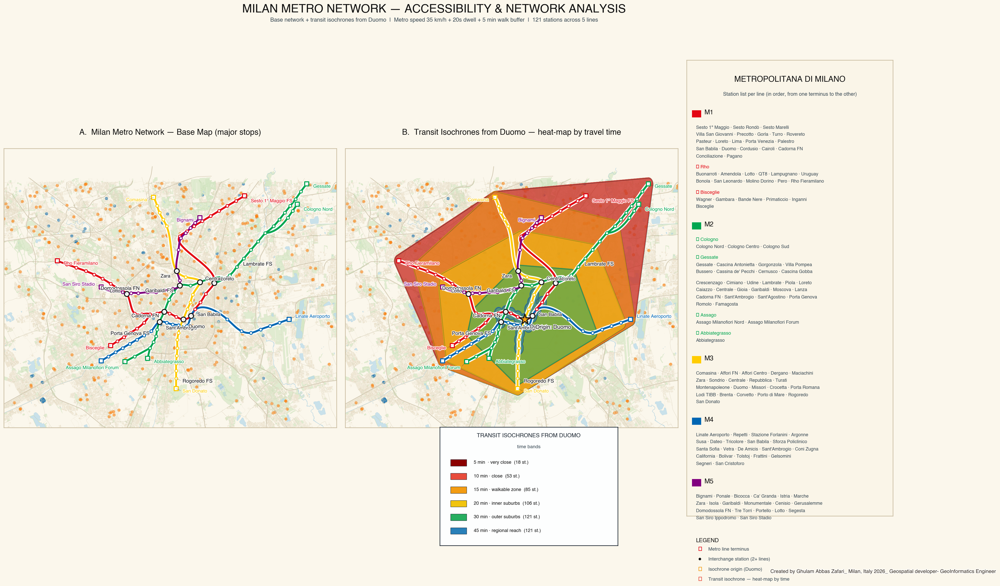


🌑 Rendering DARK version...

💾 Saving dark version...
   ✅ milan_metro_isochrones_dark.png
   ✅ milan_metro_isochrones_dark.pdf
   ✅ milan_metro_isochrones_dark.svg


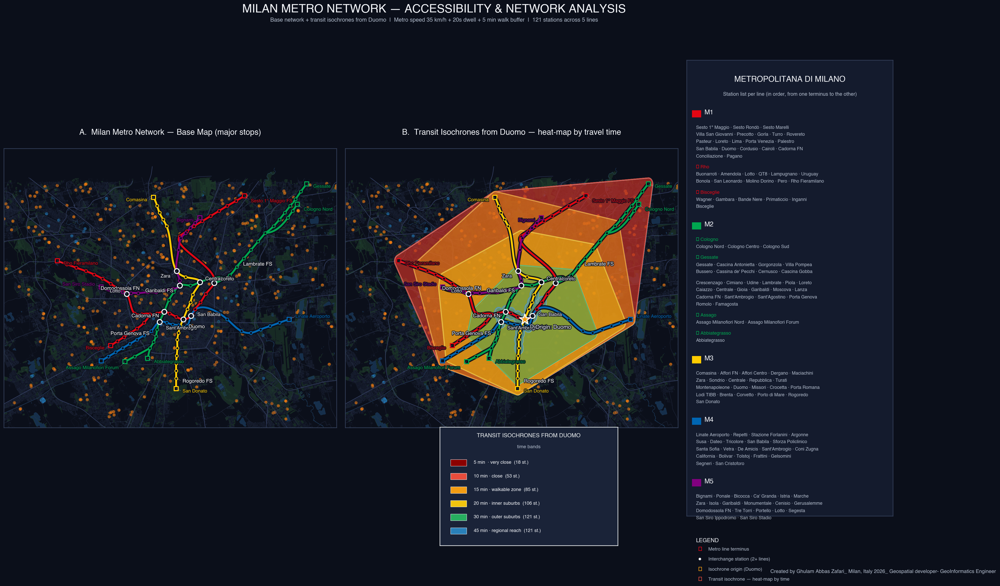


✅ All done — v17.0
   • Light: milan_metro_isochrones_light.png / .pdf / .svg
   • Dark:  milan_metro_isochrones_dark.png / .pdf / .svg


In [1]:
# MILAN METRO NETWORK + ISOCHRONES — v17.0 (dual theme: light + dark)
# Light & dark versions in one run
# Created by Ghulam Abbas Zafari — Milan, Italy 2026
# Geospatial Developer - GeoInformatics Engineer

import os
import pickle
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
from matplotlib.patheffects import withStroke
import geopandas as gpd
import numpy as np
from scipy.interpolate import splprep, splev
from shapely.geometry import Point, box
from shapely.ops import unary_union
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

print("=" * 70)
print("🏙️  MILAN METRO + ISOCHRONES — v17.0 (light + dark)")
print("=" * 70)


# ============================================================
# 1. LINE COLORS
# ============================================================
LINE_COLORS = {
    'M1': '#E30613',
    'M2': '#00A650',
    'M3': '#FFCC00',
    'M4': '#0066B3',
    'M5': '#81007F',
}

ISO_COLORS_TRANSIT = [
    '#8B0000', '#E74C3C', '#F39C12', '#F1C40F', '#27AE60', '#2980B9',
]
ISO_EDGE_COLOR_LIGHT = '#1B2631'
ISO_EDGE_COLOR_DARK = '#ECF0F1'


# ============================================================
# 2. THEME DEFINITIONS
# ============================================================
THEMES = {
    'light': {
        'fig_bg':       '#FBF7EC',
        'panel_bg':     '#FBF7EC',
        'legend_bg':    '#FAF5E8',
        'legend_face':  '#FDFEFE',
        'frame_color':  '#C9BCA0',
        'text_color':   '#111111',
        'subtext':      '#3A4A55',
        'label_hub':    '#111111',
        'label_int':    '#111111',
        'label_std':    '#2C2C2C',
        'label_halo':   'white',
        'station_fill': 'white',
        'station_edge': '#1A1A1A',
        'iso_edge':     '#1B2631',
        'iso_alpha':    0.55,
        'iso_line_alpha': 0.9,
        'legend_edge':  '#C9BCA0',
        'iso_legend_bg': '#FDFEFE',
        'legend_title': '#1B2631',
        'watermark':    '#3A3228',
        # OSM layer colors (light warm)
        'osm_buildings':   '#E8DCC4',
        'osm_buildings_e': '#D6C7A6',
        'osm_parks':       '#D2E5C2',
        'osm_parks_e':     '#BCD6A8',
        'osm_water':       '#B9DAEA',
        'osm_water_e':     '#94BFD4',
        'osm_waterway':    '#ABCFE2',
        'osm_major':       '#C9BEA4',
        'osm_mid':         '#D8CFB8',
        'osm_minor':       '#E3DBC5',
        'metro_halo':      'white',
    },
    'dark': {
        'fig_bg':       '#0B0F1A',
        'panel_bg':     '#0B0F1A',
        'legend_bg':    '#141B2D',
        'legend_face':  '#141B2D',
        'frame_color':  '#34405A',
        'text_color':   '#F2F4F8',
        'subtext':      '#B0BACA',
        'label_hub':    '#FFFFFF',
        'label_int':    '#F2F4F8',
        'label_std':    '#DDE3EC',
        'label_halo':   '#0B0F1A',
        'station_fill': '#0B0F1A',
        'station_edge': '#F2F4F8',
        'iso_edge':     '#ECF0F1',
        'iso_alpha':    0.45,
        'iso_line_alpha': 0.85,
        'legend_edge':  '#34405A',
        'iso_legend_bg': '#1A2338',
        'legend_title': '#ECF0F1',
        'watermark':    '#B0BACA',
        # OSM layer colors (dark blue-grey tones)
        'osm_buildings':   '#1C2438',
        'osm_buildings_e': '#2A3450',
        'osm_parks':       '#1E3A2A',
        'osm_parks_e':     '#274A34',
        'osm_water':       '#1B3A5C',
        'osm_water_e':     '#2A527A',
        'osm_waterway':    '#2A527A',
        'osm_major':       '#39456A',
        'osm_mid':         '#2E3854',
        'osm_minor':       '#232C42',
        'metro_halo':      '#0B0F1A',
    },
}


# ============================================================
# 3. STATIONS
# ============================================================
STATIONS = {
    'Sesto 1° Maggio FS':  (9.2425, 45.5370, ['M1'], 'terminal'),
    'Sesto Rondò':         (9.2355, 45.5340, ['M1'], 'standard'),
    'Sesto Marelli':       (9.2280, 45.5310, ['M1'], 'standard'),
    'Villa San Giovanni':  (9.2210, 45.5280, ['M1'], 'standard'),
    'Precotto':            (9.2140, 45.5250, ['M1'], 'standard'),
    'Gorla':               (9.2070, 45.5220, ['M1'], 'standard'),
    'Turro':               (9.2000, 45.5190, ['M1'], 'standard'),
    'Rovereto':            (9.1940, 45.5160, ['M1'], 'standard'),
    'Pasteur':             (9.1880, 45.5130, ['M1'], 'standard'),
    'Loreto':              (9.2170, 45.4855, ['M1','M2'], 'interchange'),
    'Lima':                (9.2100, 45.4790, ['M1'], 'standard'),
    'Porta Venezia':       (9.2055, 45.4740, ['M1'], 'standard'),
    'Palestro':            (9.2010, 45.4700, ['M1'], 'standard'),
    'San Babila':          (9.1975, 45.4660, ['M1','M4'], 'interchange'),
    'Duomo':               (9.1910, 45.4640, ['M1','M3'], 'hub'),
    'Cordusio':            (9.1850, 45.4655, ['M1'], 'standard'),
    'Cairoli':             (9.1795, 45.4675, ['M1'], 'standard'),
    'Cadorna FN':          (9.1750, 45.4685, ['M1','M2'], 'hub'),
    'Conciliazione':       (9.1690, 45.4675, ['M1'], 'standard'),
    'Pagano':              (9.1630, 45.4670, ['M1'], 'standard'),
    'Buonarroti':          (9.1560, 45.4670, ['M1'], 'standard'),
    'Amendola':            (9.1500, 45.4675, ['M1'], 'standard'),
    'Lotto':               (9.1435, 45.4790, ['M1','M5'], 'interchange'),
    'QT8':                 (9.1370, 45.4820, ['M1'], 'standard'),
    'Lampugnano':          (9.1300, 45.4850, ['M1'], 'standard'),
    'Uruguay':             (9.1230, 45.4880, ['M1'], 'standard'),
    'Bonola':              (9.1160, 45.4905, ['M1'], 'standard'),
    'San Leonardo':        (9.1090, 45.4925, ['M1'], 'standard'),
    'Molino Dorino':       (9.1010, 45.4945, ['M1'], 'standard'),
    'Pero':                (9.0930, 45.4965, ['M1'], 'standard'),
    'Rho Fieramilano':     (9.0850, 45.4985, ['M1'], 'terminal'),
    'Wagner':              (9.1580, 45.4620, ['M1'], 'standard'),
    'Gambara':             (9.1520, 45.4585, ['M1'], 'standard'),
    'Bande Nere':          (9.1465, 45.4560, ['M1'], 'standard'),
    'Primaticcio':         (9.1410, 45.4535, ['M1'], 'standard'),
    'Inganni':             (9.1355, 45.4510, ['M1'], 'standard'),
    'Bisceglie':           (9.1300, 45.4485, ['M1'], 'terminal'),
    'Cologno Nord':        (9.2870, 45.5320, ['M2'], 'terminal'),
    'Cologno Centro':      (9.2830, 45.5280, ['M2'], 'standard'),
    'Cologno Sud':         (9.2790, 45.5240, ['M2'], 'standard'),
    'Gessate':             (9.2950, 45.5440, ['M2'], 'terminal'),
    'Cascina Antonietta':  (9.2900, 45.5395, ['M2'], 'standard'),
    'Gorgonzola':          (9.2855, 45.5350, ['M2'], 'standard'),
    'Villa Pompea':        (9.2810, 45.5310, ['M2'], 'standard'),
    'Bussero':             (9.2765, 45.5270, ['M2'], 'standard'),
    "Cassina de' Pecchi":  (9.2720, 45.5230, ['M2'], 'standard'),
    'Cernusco':            (9.2670, 45.5190, ['M2'], 'standard'),
    'Cascina Gobba':       (9.2600, 45.5150, ['M2'], 'standard'),
    'Crescenzago':         (9.2540, 45.5100, ['M2'], 'standard'),
    'Cimiano':             (9.2480, 45.5050, ['M2'], 'standard'),
    'Udine':               (9.2420, 45.5000, ['M2'], 'standard'),
    'Lambrate FS':         (9.2360, 45.4950, ['M2'], 'hub'),
    'Piola':               (9.2300, 45.4900, ['M2'], 'standard'),
    'Caiazzo':             (9.2230, 45.4880, ['M2'], 'standard'),
    'Centrale FS':         (9.2050, 45.4860, ['M2','M3'], 'hub'),
    'Gioia':               (9.1970, 45.4840, ['M2'], 'standard'),
    'Garibaldi FS':        (9.1880, 45.4840, ['M2','M5'], 'hub'),
    'Moscova':             (9.1830, 45.4800, ['M2'], 'standard'),
    'Lanza':               (9.1790, 45.4755, ['M2'], 'standard'),
    "Sant'Ambrogio":       (9.1710, 45.4625, ['M2','M4'], 'interchange'),
    "Sant'Agostino":       (9.1690, 45.4580, ['M2'], 'standard'),
    'Porta Genova FS':     (9.1680, 45.4540, ['M2'], 'hub'),
    'Romolo':              (9.1660, 45.4505, ['M2'], 'standard'),
    'Famagosta':           (9.1630, 45.4470, ['M2'], 'standard'),
    'Abbiategrasso':       (9.1610, 45.4410, ['M2'], 'terminal'),
    'Assago Milanofiori Nord': (9.1500, 45.4420, ['M2'], 'standard'),
    'Assago Milanofiori Forum':(9.1420, 45.4390, ['M2'], 'terminal'),
    'Comasina':            (9.1660, 45.5360, ['M3'], 'terminal'),
    'Affori FN':           (9.1690, 45.5310, ['M3'], 'standard'),
    'Affori Centro':       (9.1710, 45.5270, ['M3'], 'standard'),
    'Dergano':             (9.1740, 45.5230, ['M3'], 'standard'),
    'Maciachini':          (9.1770, 45.5190, ['M3'], 'standard'),
    'Zara':                (9.1855, 45.4925, ['M3','M5'], 'interchange'),
    'Sondrio':             (9.1930, 45.4890, ['M3'], 'standard'),
    'Repubblica':          (9.1990, 45.4785, ['M3'], 'standard'),
    'Turati':              (9.1970, 45.4740, ['M3'], 'standard'),
    'Montenapoleone':      (9.1945, 45.4700, ['M3'], 'standard'),
    'Missori':             (9.1885, 45.4600, ['M3'], 'standard'),
    'Crocetta':            (9.1870, 45.4560, ['M3'], 'standard'),
    'Porta Romana':        (9.1860, 45.4520, ['M3'], 'standard'),
    'Lodi TIBB':           (9.1860, 45.4470, ['M3'], 'standard'),
    'Brenta':              (9.1855, 45.4425, ['M3'], 'standard'),
    'Corvetto':            (9.1850, 45.4380, ['M3'], 'standard'),
    'Porto di Mare':       (9.1850, 45.4335, ['M3'], 'standard'),
    'Rogoredo FS':         (9.1850, 45.4290, ['M3'], 'hub'),
    'San Donato':          (9.1850, 45.4230, ['M3'], 'terminal'),
    'Linate Aeroporto':    (9.2800, 45.4640, ['M4'], 'terminal'),
    'Repetti':             (9.2720, 45.4620, ['M4'], 'standard'),
    'Stazione Forlanini':  (9.2640, 45.4600, ['M4'], 'standard'),
    'Argonne':             (9.2560, 45.4580, ['M4'], 'standard'),
    'Susa':                (9.2480, 45.4560, ['M4'], 'standard'),
    'Dateo':               (9.2400, 45.4570, ['M4'], 'standard'),
    'Tricolore':           (9.2280, 45.4640, ['M4'], 'standard'),
    'Sforza Policlinico':  (9.1940, 45.4600, ['M4'], 'standard'),
    'Santa Sofia':         (9.1870, 45.4605, ['M4'], 'standard'),
    'Vetra':               (9.1820, 45.4610, ['M4'], 'standard'),
    'De Amicis':           (9.1770, 45.4620, ['M4'], 'standard'),
    'Coni Zugna':          (9.1640, 45.4570, ['M4'], 'standard'),
    'California':          (9.1580, 45.4545, ['M4'], 'standard'),
    'Bolivar':             (9.1520, 45.4520, ['M4'], 'standard'),
    'Tolstoj':             (9.1460, 45.4495, ['M4'], 'standard'),
    'Frattini':            (9.1400, 45.4470, ['M4'], 'standard'),
    'Gelsomini':           (9.1340, 45.4445, ['M4'], 'standard'),
    'Segneri':             (9.1280, 45.4420, ['M4'], 'standard'),
    'San Cristoforo FS':   (9.1220, 45.4395, ['M4'], 'terminal'),
    'Bignami':             (9.2050, 45.5240, ['M5'], 'terminal'),
    'Ponale':              (9.2010, 45.5210, ['M5'], 'standard'),
    'Bicocca':             (9.1970, 45.5180, ['M5'], 'standard'),
    "Ca' Granda":          (9.1930, 45.5150, ['M5'], 'standard'),
    'Istria':              (9.1890, 45.5120, ['M5'], 'standard'),
    'Marche':              (9.1870, 45.5050, ['M5'], 'standard'),
    'Isola':               (9.1880, 45.4870, ['M5'], 'standard'),
    'Monumentale':         (9.1820, 45.4820, ['M5'], 'standard'),
    'Cenisio':             (9.1750, 45.4810, ['M5'], 'standard'),
    'Gerusalemme':         (9.1680, 45.4800, ['M5'], 'standard'),
    'Domodossola FN':      (9.1610, 45.4800, ['M5'], 'hub'),
    'Tre Torri':           (9.1530, 45.4795, ['M5'], 'standard'),
    'Portello':            (9.1470, 45.4795, ['M5'], 'standard'),
    'Segesta':             (9.1400, 45.4800, ['M5'], 'standard'),
    'San Siro Ippodromo':  (9.1300, 45.4810, ['M5'], 'standard'),
    'San Siro Stadio':     (9.1220, 45.4830, ['M5'], 'terminal'),
}


LINES = {
    'M1': [
        ['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli','Villa San Giovanni',
         'Precotto','Gorla','Turro','Rovereto','Pasteur','Loreto','Lima',
         'Porta Venezia','Palestro','San Babila','Duomo','Cordusio','Cairoli',
         'Cadorna FN','Conciliazione','Pagano'],
        ['Pagano','Buonarroti','Amendola','Lotto','QT8','Lampugnano','Uruguay',
         'Bonola','San Leonardo','Molino Dorino','Pero','Rho Fieramilano'],
        ['Pagano','Wagner','Gambara','Bande Nere','Primaticcio','Inganni','Bisceglie'],
    ],
    'M2': [
        ['Cologno Nord','Cologno Centro','Cologno Sud','Cascina Gobba'],
        ['Gessate','Cascina Antonietta','Gorgonzola','Villa Pompea','Bussero',
         "Cassina de' Pecchi",'Cernusco','Cascina Gobba'],
        ['Cascina Gobba','Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
         'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS','Moscova',
         'Lanza','Cadorna FN',"Sant'Ambrogio","Sant'Agostino",'Porta Genova FS',
         'Romolo','Famagosta'],
        ['Famagosta','Assago Milanofiori Nord','Assago Milanofiori Forum'],
        ['Famagosta','Abbiategrasso'],
    ],
    'M3': [
        ['Comasina','Affori FN','Affori Centro','Dergano','Maciachini','Zara',
         'Sondrio','Centrale FS','Repubblica','Turati','Montenapoleone','Duomo',
         'Missori','Crocetta','Porta Romana','Lodi TIBB','Brenta','Corvetto',
         'Porto di Mare','Rogoredo FS','San Donato'],
    ],
    'M4': [
        ['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne','Susa',
         'Dateo','Tricolore','San Babila','Sforza Policlinico','Santa Sofia',
         'Vetra','De Amicis',"Sant'Ambrogio",'Coni Zugna','California','Bolivar',
         'Tolstoj','Frattini','Gelsomini','Segneri','San Cristoforo FS'],
    ],
    'M5': [
        ['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche','Zara',
         'Isola','Garibaldi FS','Monumentale','Cenisio','Gerusalemme',
         'Domodossola FN','Tre Torri','Portello','Lotto','Segesta',
         'San Siro Ippodromo','San Siro Stadio'],
    ],
}


MAJOR_STOPS = {
    'Sesto 1° Maggio FS', 'Loreto', 'Centrale FS', 'Garibaldi FS',
    'San Babila', 'Duomo', 'Cadorna FN', 'Lotto', 'Zara',
    "Sant'Ambrogio", 'Porta Genova FS', 'Lambrate FS', 'Rogoredo FS',
    'Domodossola FN', 'Rho Fieramilano', 'Bisceglie', 'San Donato',
    'Linate Aeroporto', 'Bignami', 'San Siro Stadio', 'Assago Milanofiori Forum',
    'Abbiategrasso', 'Comasina', 'Gessate', 'Cologno Nord',
}

LABEL_OFFSETS = {
    'Duomo':              (10, -14, 'left'),
    'Cadorna FN':         (-10,  -8, 'right'),
    'Centrale FS':        (10,   6, 'left'),
    'Garibaldi FS':       (-10,  -8, 'right'),
    'Loreto':             (10,   6, 'left'),
    'San Babila':         (10,   2, 'left'),
    'Lotto':              (-10,   4, 'right'),
    'Zara':               (-10,  -8, 'right'),
    "Sant'Ambrogio":      (10,  -10, 'left'),
    'Lambrate FS':        (10,   4, 'left'),
    'Rogoredo FS':        (10,  -4, 'left'),
    'Porta Genova FS':    (-10,   4, 'right'),
    'Domodossola FN':     (-12,   6, 'right'),
    'Bisceglie':          (-10,  -4, 'right'),
    'San Donato':         (10,  -4, 'left'),
    'Linate Aeroporto':   (10,   4, 'left'),
    'San Siro Stadio':    (-10,   4, 'right'),
    'Bignami':            (-10,  -4, 'right'),
    'Comasina':           (-10,  -4, 'right'),
    'Rho Fieramilano':    (10,  -4, 'left'),
    'Abbiategrasso':      (10,  -6, 'left'),
    'Assago Milanofiori Forum': (-10, -10, 'right'),
    'Sesto 1° Maggio FS': (10,  -8, 'left'),
    'Gessate':            (10,  -4, 'left'),
    'Cologno Nord':       (10,  -8, 'left'),
}


def resolve_label_overlaps(labels_dict, min_dist_pt=18):
    cleaned = {}
    for name, (dx, dy, ha) in labels_dict.items():
        mag = (dx * dx + dy * dy) ** 0.5
        if 0 < mag < 8:
            scale = 10 / mag
            dx = int(dx * scale); dy = int(dy * scale)
        cleaned[name] = (dx, dy, ha)
    items = list(cleaned.items())
    for i in range(len(items)):
        n1, (dx1, dy1, ha1) = items[i]
        for j in range(i + 1, len(items)):
            n2, (dx2, dy2, ha2) = items[j]
            dist = ((dx1 - dx2) ** 2 + (dy1 - dy2) ** 2) ** 0.5
            if dist < min_dist_pt:
                if dx2 != 0 or dy2 != 0:
                    cleaned[n2] = (int(dx2 * 1.25) or 10,
                                   int(dy2 * 1.25) or 6, ha2)
                else:
                    cleaned[n2] = (10, 6, ha2)
    return cleaned

LABEL_OFFSETS = resolve_label_overlaps(LABEL_OFFSETS)


# ============================================================
# 4. GRAPH + ISOCHRONES
# ============================================================
def build_metro_graph():
    G = nx.Graph()
    for name, (lon, lat, lines, stype) in STATIONS.items():
        G.add_node(name, x=lon, y=lat, lines=lines, type=stype)

    METRO_SPEED_MS = 35.0 * 1000 / 3600
    DWELL_TIME_S = 20

    def haversine_m(lon1, lat1, lon2, lat2):
        R = 6371000
        phi1, phi2 = np.radians(lat1), np.radians(lat2)
        dphi = np.radians(lat2 - lat1); dlam = np.radians(lon2 - lon1)
        a = (np.sin(dphi/2)**2 +
             np.cos(phi1) * np.cos(phi2) * np.sin(dlam/2)**2)
        return 2 * R * np.arcsin(np.sqrt(a))

    for line_name, branches in LINES.items():
        for branch in branches:
            for i in range(len(branch) - 1):
                a, b = branch[i], branch[i + 1]
                lon1, lat1, *_ = STATIONS[a]
                lon2, lat2, *_ = STATIONS[b]
                dist_m = haversine_m(lon1, lat1, lon2, lat2)
                total_s = dist_m / METRO_SPEED_MS + DWELL_TIME_S
                if G.has_edge(a, b):
                    if total_s < G[a][b]['weight']:
                        G[a][b]['weight'] = total_s
                        G[a][b]['line'] = line_name
                else:
                    G.add_edge(a, b, weight=total_s, line=line_name)
    print(f"✅ Metro graph: {G.number_of_nodes()} nodes, "
          f"{G.number_of_edges()} edges")
    return G


def compute_metro_isochrones(G, origin_name, time_minutes_list):
    WALK_BUFFER_M = 400
    lat_deg_per_m = 1 / 111000
    isochrones = {}
    for tmin in time_minutes_list:
        cutoff_s = tmin * 60
        lengths = nx.single_source_dijkstra_path_length(
            G, origin_name, weight='weight', cutoff=cutoff_s)
        reachable = list(lengths.keys())
        if len(reachable) < 2:
            continue
        pts = [Point(STATIONS[n][0], STATIONS[n][1]) for n in reachable]
        buffered = unary_union([p.buffer(WALK_BUFFER_M * lat_deg_per_m)
                                for p in pts])
        polygon = buffered.convex_hull if buffered.geom_type == 'MultiPolygon' \
                  else buffered
        isochrones[tmin] = {
            'polygon': polygon,
            'stations': reachable,
            'n_stations': len(reachable),
        }
    return isochrones


# ============================================================
# 5. OSM LOADER
# ============================================================
def load_osm_city(bbox, cache_file='./osm_cache/milan_city.pkl'):
    os.makedirs(os.path.dirname(cache_file), exist_ok=True)
    if os.path.exists(cache_file):
        try:
            with open(cache_file, 'rb') as f:
                layers = pickle.load(f)
            print("🌍 OSM city layers loaded from cache")
            return layers
        except Exception:
            pass
    print("🌍 Downloading OSM city layers (first run, ~2–4 min)...")
    poly = box(bbox[0], bbox[1], bbox[2], bbox[3])
    layers = {}
    tag_queries = {
        'roads':     {'highway': ['motorway', 'trunk', 'primary', 'secondary',
                                  'tertiary', 'residential', 'unclassified',
                                  'living_street', 'pedestrian', 'service']},
        'buildings': {'building': True},
        'parks':     {'leisure': ['park', 'garden', 'playground'],
                      'landuse': ['grass', 'forest', 'meadow', 'village_green']},
        'water':     {'natural': 'water'},
        'waterway':  {'waterway': ['river', 'canal', 'stream']},
    }
    for key, tags in tag_queries.items():
        try:
            gdf = ox.features_from_polygon(poly, tags=tags)
            layers[key] = gdf
            print(f"   ✓ {key}: {len(gdf)}")
        except Exception as e:
            print(f"   ⚠️ {key}: {e}")
            layers[key] = gpd.GeoDataFrame()
    try:
        with open(cache_file, 'wb') as f:
            pickle.dump(layers, f)
        print(f"💾 Cached to {cache_file}")
    except Exception:
        pass
    return layers


# ============================================================
# 6. DRAWING HELPERS (theme-aware)
# ============================================================
def draw_urban_basemap(ax, layers, th):
    if len(layers.get('buildings', [])) > 0:
        try:
            layers['buildings'].plot(ax=ax, facecolor=th['osm_buildings'],
                                     edgecolor=th['osm_buildings_e'],
                                     linewidth=0.10, alpha=0.65, zorder=0.5)
        except Exception:
            pass
    if len(layers.get('parks', [])) > 0:
        try:
            layers['parks'].plot(ax=ax, facecolor=th['osm_parks'],
                                 edgecolor=th['osm_parks_e'],
                                 linewidth=0.15, alpha=0.65, zorder=1)
        except Exception:
            pass
    if len(layers.get('water', [])) > 0:
        try:
            layers['water'].plot(ax=ax, facecolor=th['osm_water'],
                                 edgecolor=th['osm_water_e'],
                                 linewidth=0.2, alpha=0.75, zorder=1.2)
        except Exception:
            pass
    if len(layers.get('waterway', [])) > 0:
        try:
            layers['waterway'].plot(ax=ax, color=th['osm_waterway'],
                                    linewidth=0.8, alpha=0.7, zorder=1.3)
        except Exception:
            pass
    if len(layers.get('roads', [])) > 0:
        try:
            roads = layers['roads']
            major = roads[roads['highway'].isin(['motorway','trunk','primary'])]
            if len(major) > 0:
                major.plot(ax=ax, color=th['osm_major'], linewidth=0.9,
                           alpha=0.65, zorder=1.5)
            mid = roads[roads['highway'].isin(['secondary','tertiary'])]
            if len(mid) > 0:
                mid.plot(ax=ax, color=th['osm_mid'], linewidth=0.55,
                         alpha=0.65, zorder=1.5)
            minor = roads[roads['highway'].isin(['residential','unclassified',
                                                 'living_street','pedestrian',
                                                 'service'])]
            if len(minor) > 0:
                minor.plot(ax=ax, color=th['osm_minor'], linewidth=0.30,
                           alpha=0.60, zorder=1.4)
        except Exception:
            pass


def smooth_path(xs, ys, n=240, k=3):
    xs = np.asarray(xs, dtype=float); ys = np.asarray(ys, dtype=float)
    if len(xs) < 4:
        k = max(1, len(xs) - 1)
    try:
        tck, _ = splprep([xs, ys], s=0, k=k)
        u = np.linspace(0, 1, n)
        return splev(u, tck)
    except Exception:
        return xs, ys


def draw_metro_network(ax, th):
    for line_name, branches in LINES.items():
        color = LINE_COLORS[line_name]
        for branch in branches:
            xs = [STATIONS[s][0] for s in branch]
            ys = [STATIONS[s][1] for s in branch]
            sx, sy = smooth_path(xs, ys, n=240, k=3)
            ax.plot(sx, sy, color=th['metro_halo'], linewidth=8, alpha=0.95,
                    solid_capstyle='round', solid_joinstyle='round', zorder=4)
            ax.plot(sx, sy, color=color, linewidth=3.5,
                    solid_capstyle='round', solid_joinstyle='round',
                    zorder=5, alpha=1.0)


def draw_stations(ax, th):
    for name, (lon, lat, lines, stype) in STATIONS.items():
        if len(lines) > 1:
            ax.scatter(lon, lat, s=85, marker='o',
                       facecolor=th['station_fill'],
                       edgecolor=th['station_edge'],
                       linewidth=1.9, zorder=8)
        elif stype == 'terminal':
            ax.scatter(lon, lat, s=55, marker='s',
                       facecolor=th['station_fill'],
                       edgecolor=LINE_COLORS[lines[0]],
                       linewidth=1.9, zorder=8)
        else:
            ax.scatter(lon, lat, s=30, marker='o',
                       facecolor=th['station_fill'],
                       edgecolor=LINE_COLORS[lines[0]],
                       linewidth=1.5, zorder=8)


def draw_major_labels(ax, th):
    for name in MAJOR_STOPS:
        lon, lat, lines, stype = STATIONS[name]
        dx, dy, ha = LABEL_OFFSETS.get(name, (8, 8, 'left'))

        if stype == 'hub':
            fs, fw = 9.5, 'bold'
            col = th['label_hub']
        elif stype == 'interchange':
            fs, fw = 9.0, 'bold'
            col = th['label_int']
        elif stype == 'terminal':
            fs, fw = 8.8, 'bold'
            col = LINE_COLORS[lines[0]]
        else:
            fs, fw = 8.5, 'normal'
            col = th['label_std']

        mag = (dx * dx + dy * dy) ** 0.5
        if mag >= 12:
            ax.annotate(
                '', xy=(lon, lat),
                xytext=(dx * 0.72, dy * 0.72),
                textcoords='offset points',
                arrowprops=dict(arrowstyle='-', lw=0.6,
                                color=th['subtext'], alpha=0.55,
                                shrinkA=0, shrinkB=0),
                zorder=9.5,
            )

        ax.annotate(
            name, (lon, lat), xytext=(dx, dy),
            textcoords='offset points', ha=ha, va='center',
            fontsize=fs, fontweight=fw, color=col, zorder=11,
            path_effects=[withStroke(linewidth=2.4,
                                     foreground=th['label_halo'],
                                     alpha=0.95)],
        )


def build_station_list_for_legend():
    def fmt(lst):
        return [s.replace(' FS', '').strip() for s in lst]

    return {
        'M1': {'color': LINE_COLORS['M1'], 'branches': [
            fmt(['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli',
                 'Villa San Giovanni','Precotto','Gorla','Turro',
                 'Rovereto','Pasteur','Loreto','Lima','Porta Venezia',
                 'Palestro','San Babila','Duomo','Cordusio','Cairoli',
                 'Cadorna FN','Conciliazione','Pagano']),
            ('↳ Rho', fmt(['Buonarroti','Amendola','Lotto','QT8','Lampugnano',
                           'Uruguay','Bonola','San Leonardo','Molino Dorino',
                           'Pero','Rho Fieramilano'])),
            ('↳ Bisceglie', fmt(['Wagner','Gambara','Bande Nere','Primaticcio',
                                 'Inganni','Bisceglie'])),
        ]},
        'M2': {'color': LINE_COLORS['M2'], 'branches': [
            ('↳ Cologno', fmt(['Cologno Nord','Cologno Centro','Cologno Sud'])),
            ('↳ Gessate', fmt(['Gessate','Cascina Antonietta','Gorgonzola',
                               'Villa Pompea','Bussero',"Cassina de' Pecchi",
                               'Cernusco','Cascina Gobba'])),
            fmt(['Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
                 'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS',
                 'Moscova','Lanza','Cadorna FN',"Sant'Ambrogio",
                 "Sant'Agostino",'Porta Genova FS','Romolo','Famagosta']),
            ('↳ Assago', fmt(['Assago Milanofiori Nord',
                              'Assago Milanofiori Forum'])),
            ('↳ Abbiategrasso', fmt(['Abbiategrasso'])),
        ]},
        'M3': {'color': LINE_COLORS['M3'], 'branches': [
            fmt(['Comasina','Affori FN','Affori Centro','Dergano',
                 'Maciachini','Zara','Sondrio','Centrale FS','Repubblica',
                 'Turati','Montenapoleone','Duomo','Missori','Crocetta',
                 'Porta Romana','Lodi TIBB','Brenta','Corvetto',
                 'Porto di Mare','Rogoredo FS','San Donato']),
        ]},
        'M4': {'color': LINE_COLORS['M4'], 'branches': [
            fmt(['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne',
                 'Susa','Dateo','Tricolore','San Babila',
                 'Sforza Policlinico','Santa Sofia','Vetra','De Amicis',
                 "Sant'Ambrogio",'Coni Zugna','California','Bolivar',
                 'Tolstoj','Frattini','Gelsomini','Segneri',
                 'San Cristoforo FS']),
        ]},
        'M5': {'color': LINE_COLORS['M5'], 'branches': [
            fmt(['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche',
                 'Zara','Isola','Garibaldi FS','Monumentale','Cenisio',
                 'Gerusalemme','Domodossola FN','Tre Torri','Portello',
                 'Lotto','Segesta','San Siro Ippodromo','San Siro Stadio']),
        ]},
    }


# ============================================================
# 7. THEME RENDERER
# ============================================================
def render_figure(theme_name, iso, layers, origin='Duomo', times=None):
    """Render the whole figure with the given theme: 'light' or 'dark'."""
    th = THEMES[theme_name]
    if times is None:
        times = [5, 10, 15, 20, 30, 45]

    fig = plt.figure(figsize=(30, 15.5), dpi=150)
    fig.patch.set_facecolor(th['fig_bg'])
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.62], wspace=0.03)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    axL = fig.add_subplot(gs[0, 2])

    for ax in (ax1, ax2):
        ax.set_facecolor(th['panel_bg'])
        ax.set_xlim(9.04, 9.32)
        ax.set_ylim(45.40, 45.565)
        ax.set_xticks([]); ax.set_yticks([])
        for s in ax.spines.values():
            s.set_visible(True)
            s.set_color(th['frame_color'])
            s.set_linewidth(1.2)

    axL.set_facecolor(th['legend_bg'])
    axL.set_xticks([]); axL.set_yticks([])
    axL.set_xlim(0, 1); axL.set_ylim(0, 1)
    for s in axL.spines.values():
        s.set_visible(True)
        s.set_color(th['frame_color'])
        s.set_linewidth(1.2)

    # ---- OSM basemap ----
    try:
        draw_urban_basemap(ax1, layers, th)
        draw_urban_basemap(ax2, layers, th)
    except Exception as e:
        print(f"⚠️ Basemap failed [{theme_name}]: {e}")

    # ================================================================
    # PANEL A — base network
    # ================================================================
    draw_metro_network(ax1, th)
    draw_stations(ax1, th)
    draw_major_labels(ax1, th)
    ax1.set_title('A.  Milan Metro Network — Base Map (major stops)',
                  fontsize=15, fontweight='bold', pad=26,
                  color=th['text_color'])

    # ================================================================
    # PANEL B — isochrones
    # ================================================================
    sorted_times = sorted(iso.keys(), reverse=True)
    for i, t in enumerate(sorted_times):
        poly = iso[t]['polygon']
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        gpd.GeoSeries([poly], crs='EPSG:4326').plot(
            ax=ax2, facecolor=color, edgecolor=th['iso_edge'],
            linewidth=2.0, alpha=th['iso_alpha'], zorder=3)
        gpd.GeoSeries([poly], crs='EPSG:4326').boundary.plot(
            ax=ax2, color=color, linewidth=1.2,
            alpha=th['iso_line_alpha'], zorder=3.1)

    draw_metro_network(ax2, th)
    draw_stations(ax2, th)

    ox_, oy_ = STATIONS[origin][0], STATIONS[origin][1]
    ax2.scatter(ox_, oy_, s=420, marker='*', facecolor='#F39C12',
                edgecolor=th['station_edge'], linewidth=2.0, zorder=12)
    ax2.annotate(f'  Origin: {origin}', (ox_, oy_),
                 xytext=(14, -18), textcoords='offset points',
                 fontsize=10.5, fontweight='bold',
                 color=th['text_color'], zorder=13,
                 path_effects=[withStroke(linewidth=2.5,
                                          foreground=th['label_halo'],
                                          alpha=0.95)])

    draw_major_labels(ax2, th)
    ax2.set_title('B.  Transit Isochrones from Duomo — heat-map by travel time',
                  fontsize=15, fontweight='bold', pad=26,
                  color=th['text_color'])

    # ---- Isochrone legend as inset axes ----
    labels_by_time = {
        5:  '5 min  · very close',
        10: '10 min · close',
        15: '15 min · walkable zone',
        20: '20 min · inner suburbs',
        30: '30 min · outer suburbs',
        45: '45 min · regional reach',
    }
    legend_ax = fig.add_axes([0.505, 0.06, 0.155, 0.20])
    legend_ax.set_facecolor(th['iso_legend_bg'])
    legend_ax.set_xticks([]); legend_ax.set_yticks([])
    for s in legend_ax.spines.values():
        s.set_visible(True)
        s.set_color(th['iso_edge'])
        s.set_linewidth(1.2)

    legend_ax.text(0.5, 0.95, 'TRANSIT ISOCHRONES FROM DUOMO',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=10.5, fontweight='bold', color=th['legend_title'])
    legend_ax.text(0.5, 0.85, 'time bands',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=9, style='italic', color=th['subtext'])

    y_leg = 0.70
    for i, t in enumerate(sorted(times)):
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        legend_ax.add_patch(Rectangle((0.06, y_leg - 0.028), 0.09, 0.055,
                                       facecolor=color,
                                       edgecolor=th['iso_edge'],
                                       linewidth=0.6,
                                       transform=legend_ax.transAxes))
        legend_ax.text(0.19, y_leg,
                       f'{labels_by_time.get(t, f"{t} min")}  '
                       f'({iso[t]["n_stations"]} st.)',
                       transform=legend_ax.transAxes, va='center',
                       fontsize=8.8, color=th['text_color'])
        y_leg -= 0.115

    # ================================================================
    # PANEL C — full station list legend
    # ================================================================
    axL.text(0.5, 0.965, 'METROPOLITANA DI MILANO',
             ha='center', va='top', fontsize=15, fontweight='bold',
             color=th['text_color'], transform=axL.transAxes)
    axL.text(0.5, 0.930,
             'Station list per line (in order, from one terminus to the other)',
             ha='center', va='top', style='italic',
             fontsize=9.5, color=th['subtext'], transform=axL.transAxes)

    station_data = build_station_list_for_legend()
    y_cursor = 0.885
    line_gap = 0.020
    small_lh = 0.0158

    for line_name in ['M1', 'M2', 'M3', 'M4', 'M5']:
        info = station_data[line_name]
        color = info['color']

        axL.add_patch(Rectangle((0.025, y_cursor - 0.011), 0.045, 0.016,
                                facecolor=color, edgecolor='none',
                                transform=axL.transAxes, clip_on=False))
        axL.text(0.085, y_cursor, f'{line_name}',
                 fontsize=12.5, fontweight='bold', color=th['text_color'],
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.028

        for entry in info['branches']:
            if isinstance(entry, tuple):
                label, stations = entry
                axL.text(0.045, y_cursor, label,
                         fontsize=9, fontweight='bold', color=color,
                         va='top', transform=axL.transAxes)
                y_cursor -= small_lh
                text = ' · '.join(stations)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln, fontsize=8.5,
                             color=th['subtext'], va='top',
                             transform=axL.transAxes)
                    y_cursor -= small_lh
            else:
                text = ' · '.join(entry)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln, fontsize=8.5,
                             color=th['subtext'], va='top',
                             transform=axL.transAxes)
                    y_cursor -= small_lh
            y_cursor -= 0.008
        y_cursor -= line_gap

    # Key at bottom of legend panel
    axL.text(0.045, y_cursor - 0.005, 'LEGEND',
             fontsize=10.5, fontweight='bold', color=th['text_color'],
             va='top', transform=axL.transAxes)
    y_cursor -= 0.030

    key_items = [
        ('■',  LINE_COLORS['M1'], 'Metro line terminus'),
        ('●',  th['text_color'],  'Interchange station (2+ lines)'),
        ('★',  '#F39C12',         'Isochrone origin (Duomo)'),
        ('▨',  '#E74C3C',         'Transit isochrone — heat-map by time'),
    ]
    for glyph, col, desc in key_items:
        axL.text(0.055, y_cursor, glyph, fontsize=11, color=col,
                 va='center', transform=axL.transAxes)
        axL.text(0.105, y_cursor, desc, fontsize=9, color=th['subtext'],
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.022

    # ================================================================
    # FIGURE TITLE + WATERMARK
    # ================================================================
    fig.suptitle('MILAN METRO NETWORK — ACCESSIBILITY & NETWORK ANALYSIS',
                 fontsize=22, fontweight='bold', y=0.975,
                 color=th['text_color'])
    fig.text(0.5, 0.945,
             f'Base network + transit isochrones from {origin}  |  '
             f'Metro speed 35 km/h + 20s dwell + 5 min walk buffer  |  '
             f'{len(STATIONS)} stations across 5 lines',
             ha='center', fontsize=10.5, color=th['subtext'],
             style='italic')

    signature = ('Created by Ghulam Abbas Zafari_ Milan, Italy 2026_ '
                 'Geospatial developer- GeoInformatics Engineer')
    fig.text(0.99, 0.012, signature,
             ha='right', va='bottom',
             fontsize=9.5, color=th['watermark'],
             family='Helvetica', style='italic',
             path_effects=[withStroke(linewidth=2.5,
                                      foreground=th['label_halo'],
                                      alpha=0.85)])

    plt.tight_layout(rect=[0, 0.06, 1, 0.94])

    # Save
    print(f"\n💾 Saving {theme_name} version...")
    for fn in [f'milan_metro_isochrones_{theme_name}.png',
               f'milan_metro_isochrones_{theme_name}.pdf',
               f'milan_metro_isochrones_{theme_name}.svg']:
        try:
            plt.savefig(fn, dpi=300, bbox_inches='tight',
                        facecolor=th['fig_bg'], edgecolor='none')
            print(f"   ✅ {fn}")
        except Exception as e:
            print(f"   ⚠️ {fn}: {e}")

    plt.show()


# ============================================================
# 8. MAIN
# ============================================================
def main():
    G = build_metro_graph()
    ORIGIN = 'Duomo'
    TIMES = [5, 10, 15, 20, 30, 45]
    print(f"\n🕒 Computing isochrones from '{ORIGIN}' at {TIMES} min...")
    iso = compute_metro_isochrones(G, ORIGIN, TIMES)
    for t in sorted(iso):
        print(f"   • {t:>2} min → {iso[t]['n_stations']:>3} stations")

    print("\n🌍 Loading OSM layers...")
    try:
        layers = load_osm_city((9.04, 45.40, 9.32, 45.565))
    except Exception as e:
        print(f"⚠️ OSM load failed: {e}")
        layers = {}

    # ---- Render LIGHT version ----
    print("\n" + "=" * 70)
    print("🎨 Rendering LIGHT version...")
    print("=" * 70)
    render_figure('light', iso, layers, origin=ORIGIN, times=TIMES)

    # ---- Render DARK version ----
    print("\n" + "=" * 70)
    print("🌑 Rendering DARK version...")
    print("=" * 70)
    render_figure('dark', iso, layers, origin=ORIGIN, times=TIMES)

    print("\n" + "=" * 70)
    print("✅ All done — v17.0")
    print(f"   • Light: milan_metro_isochrones_light.png / .pdf / .svg")
    print(f"   • Dark:  milan_metro_isochrones_dark.png / .pdf / .svg")
    print("=" * 70)


if __name__ == '__main__':
    main()

🌑  MILAN METRO + ISOCHRONES — v20.0 (clean dark basemap)
✅ Metro graph: 121 nodes, 125 edges

🕒 Computing isochrones from 'Duomo' at [5, 10, 15, 20, 30, 45] min...
   •  5 min →  18 stations
   • 10 min →  53 stations
   • 15 min →  85 stations
   • 20 min → 106 stations
   • 30 min → 121 stations
   • 45 min → 121 stations

🌍 Loading OSM layers (roads + big parks only)...
🔄 Old cache detected — refreshing...
🌍 Downloading OSM context layers (roads + big parks only)...
   ✓ roads: 45127
   · parks raw: 11772
   ✓ parks (>1 ha): 934 of 11772
💾 Cached to ./osm_cache/milan_city.pkl
🎨 Basemap drawn (934 big parks, 45127 road segments)

💾 Saving...
   ✅ milan_metro_isochrones_dark.png
   ✅ milan_metro_isochrones_dark.pdf
   ✅ milan_metro_isochrones_dark.svg


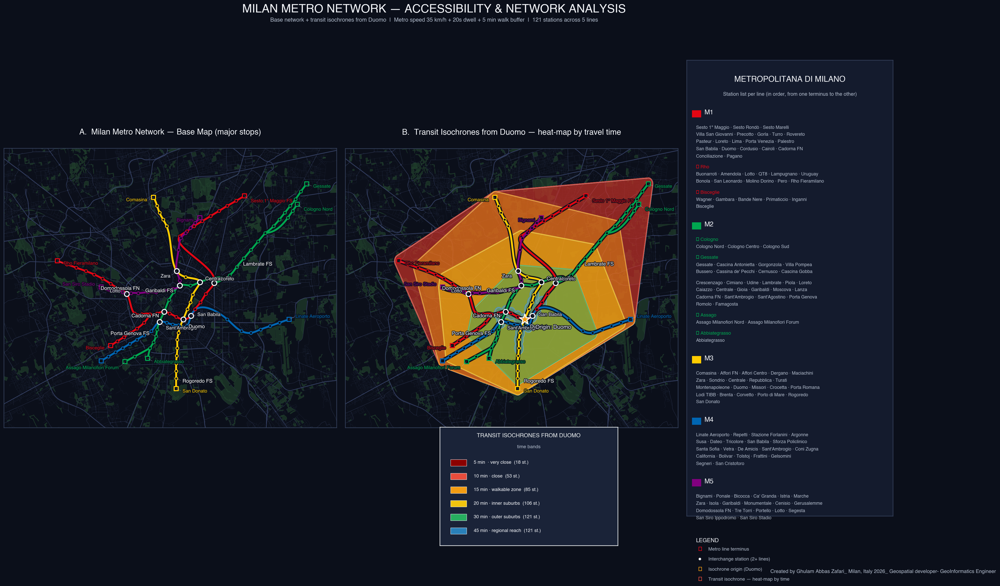

✅ Analysis complete — v20.0 (only big parks + roads)
   • Metro graph: 121 nodes, 125 edges
   • Isochrone bands: [5, 10, 15, 20, 30, 45] min


In [4]:
# MILAN METRO NETWORK + ISOCHRONES — v20.0 (DARK, ONLY BIG PARKS + ROADS)
# Clean dark presentation — no buildings, no water, no tiny green patches
# Created by Ghulam Abbas Zafari — Milan, Italy 2026
# Geospatial Developer - GeoInformatics Engineer

import os
import pickle
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.patheffects import withStroke
import geopandas as gpd
import numpy as np
from scipy.interpolate import splprep, splev
from shapely.geometry import Point, box
from shapely.ops import unary_union
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

print("=" * 70)
print("🌑  MILAN METRO + ISOCHRONES — v20.0 (clean dark basemap)")
print("=" * 70)


# ============================================================
# 1. LINE COLORS
# ============================================================
LINE_COLORS = {
    'M1': '#E30613',
    'M2': '#00A650',
    'M3': '#FFCC00',
    'M4': '#0066B3',
    'M5': '#81007F',
}

ISO_COLORS_TRANSIT = [
    '#8B0000', '#E74C3C', '#F39C12', '#F1C40F', '#27AE60', '#2980B9',
]


# ============================================================
# 2. DARK THEME
# ============================================================
TH = {
    'fig_bg':       '#0B0F1A',
    'panel_bg':     '#0B0F1A',
    'legend_bg':    '#141B2D',
    'frame_color':  '#34405A',
    'text_color':   '#F2F4F8',
    'subtext':      '#B0BACA',
    'label_hub':    '#FFFFFF',
    'label_int':    '#F2F4F8',
    'label_std':    '#DDE3EC',
    'label_halo':   '#0B0F1A',
    'station_fill': '#0B0F1A',
    'station_edge': '#F2F4F8',
    'iso_edge':     '#ECF0F1',
    'iso_alpha':    0.45,
    'iso_line_alpha': 0.85,
    'legend_edge':  '#34405A',
    'iso_legend_bg': '#1A2338',
    'legend_title': '#ECF0F1',
    'watermark':    '#B0BACA',
    # Only parks (filtered) + roads
    'osm_parks':       '#1E3A2A',
    'osm_parks_e':     '#274A34',
    'osm_major':       '#39456A',
    'osm_mid':         '#2E3854',
    'osm_minor':       '#232C42',
    'metro_halo':      '#0B0F1A',
}


# ============================================================
# 3. STATIONS
# ============================================================
STATIONS = {
    'Sesto 1° Maggio FS':  (9.2425, 45.5370, ['M1'], 'terminal'),
    'Sesto Rondò':         (9.2355, 45.5340, ['M1'], 'standard'),
    'Sesto Marelli':       (9.2280, 45.5310, ['M1'], 'standard'),
    'Villa San Giovanni':  (9.2210, 45.5280, ['M1'], 'standard'),
    'Precotto':            (9.2140, 45.5250, ['M1'], 'standard'),
    'Gorla':               (9.2070, 45.5220, ['M1'], 'standard'),
    'Turro':               (9.2000, 45.5190, ['M1'], 'standard'),
    'Rovereto':            (9.1940, 45.5160, ['M1'], 'standard'),
    'Pasteur':             (9.1880, 45.5130, ['M1'], 'standard'),
    'Loreto':              (9.2170, 45.4855, ['M1','M2'], 'interchange'),
    'Lima':                (9.2100, 45.4790, ['M1'], 'standard'),
    'Porta Venezia':       (9.2055, 45.4740, ['M1'], 'standard'),
    'Palestro':            (9.2010, 45.4700, ['M1'], 'standard'),
    'San Babila':          (9.1975, 45.4660, ['M1','M4'], 'interchange'),
    'Duomo':               (9.1910, 45.4640, ['M1','M3'], 'hub'),
    'Cordusio':            (9.1850, 45.4655, ['M1'], 'standard'),
    'Cairoli':             (9.1795, 45.4675, ['M1'], 'standard'),
    'Cadorna FN':          (9.1750, 45.4685, ['M1','M2'], 'hub'),
    'Conciliazione':       (9.1690, 45.4675, ['M1'], 'standard'),
    'Pagano':              (9.1630, 45.4670, ['M1'], 'standard'),
    'Buonarroti':          (9.1560, 45.4670, ['M1'], 'standard'),
    'Amendola':            (9.1500, 45.4675, ['M1'], 'standard'),
    'Lotto':               (9.1435, 45.4790, ['M1','M5'], 'interchange'),
    'QT8':                 (9.1370, 45.4820, ['M1'], 'standard'),
    'Lampugnano':          (9.1300, 45.4850, ['M1'], 'standard'),
    'Uruguay':             (9.1230, 45.4880, ['M1'], 'standard'),
    'Bonola':              (9.1160, 45.4905, ['M1'], 'standard'),
    'San Leonardo':        (9.1090, 45.4925, ['M1'], 'standard'),
    'Molino Dorino':       (9.1010, 45.4945, ['M1'], 'standard'),
    'Pero':                (9.0930, 45.4965, ['M1'], 'standard'),
    'Rho Fieramilano':     (9.0850, 45.4985, ['M1'], 'terminal'),
    'Wagner':              (9.1580, 45.4620, ['M1'], 'standard'),
    'Gambara':             (9.1520, 45.4585, ['M1'], 'standard'),
    'Bande Nere':          (9.1465, 45.4560, ['M1'], 'standard'),
    'Primaticcio':         (9.1410, 45.4535, ['M1'], 'standard'),
    'Inganni':             (9.1355, 45.4510, ['M1'], 'standard'),
    'Bisceglie':           (9.1300, 45.4485, ['M1'], 'terminal'),
    'Cologno Nord':        (9.2870, 45.5320, ['M2'], 'terminal'),
    'Cologno Centro':      (9.2830, 45.5280, ['M2'], 'standard'),
    'Cologno Sud':         (9.2790, 45.5240, ['M2'], 'standard'),
    'Gessate':             (9.2950, 45.5440, ['M2'], 'terminal'),
    'Cascina Antonietta':  (9.2900, 45.5395, ['M2'], 'standard'),
    'Gorgonzola':          (9.2855, 45.5350, ['M2'], 'standard'),
    'Villa Pompea':        (9.2810, 45.5310, ['M2'], 'standard'),
    'Bussero':             (9.2765, 45.5270, ['M2'], 'standard'),
    "Cassina de' Pecchi":  (9.2720, 45.5230, ['M2'], 'standard'),
    'Cernusco':            (9.2670, 45.5190, ['M2'], 'standard'),
    'Cascina Gobba':       (9.2600, 45.5150, ['M2'], 'standard'),
    'Crescenzago':         (9.2540, 45.5100, ['M2'], 'standard'),
    'Cimiano':             (9.2480, 45.5050, ['M2'], 'standard'),
    'Udine':               (9.2420, 45.5000, ['M2'], 'standard'),
    'Lambrate FS':         (9.2360, 45.4950, ['M2'], 'hub'),
    'Piola':               (9.2300, 45.4900, ['M2'], 'standard'),
    'Caiazzo':             (9.2230, 45.4880, ['M2'], 'standard'),
    'Centrale FS':         (9.2050, 45.4860, ['M2','M3'], 'hub'),
    'Gioia':               (9.1970, 45.4840, ['M2'], 'standard'),
    'Garibaldi FS':        (9.1880, 45.4840, ['M2','M5'], 'hub'),
    'Moscova':             (9.1830, 45.4800, ['M2'], 'standard'),
    'Lanza':               (9.1790, 45.4755, ['M2'], 'standard'),
    "Sant'Ambrogio":       (9.1710, 45.4625, ['M2','M4'], 'interchange'),
    "Sant'Agostino":       (9.1690, 45.4580, ['M2'], 'standard'),
    'Porta Genova FS':     (9.1680, 45.4540, ['M2'], 'hub'),
    'Romolo':              (9.1660, 45.4505, ['M2'], 'standard'),
    'Famagosta':           (9.1630, 45.4470, ['M2'], 'standard'),
    'Abbiategrasso':       (9.1610, 45.4410, ['M2'], 'terminal'),
    'Assago Milanofiori Nord': (9.1500, 45.4420, ['M2'], 'standard'),
    'Assago Milanofiori Forum':(9.1420, 45.4390, ['M2'], 'terminal'),
    'Comasina':            (9.1660, 45.5360, ['M3'], 'terminal'),
    'Affori FN':           (9.1690, 45.5310, ['M3'], 'standard'),
    'Affori Centro':       (9.1710, 45.5270, ['M3'], 'standard'),
    'Dergano':             (9.1740, 45.5230, ['M3'], 'standard'),
    'Maciachini':          (9.1770, 45.5190, ['M3'], 'standard'),
    'Zara':                (9.1855, 45.4925, ['M3','M5'], 'interchange'),
    'Sondrio':             (9.1930, 45.4890, ['M3'], 'standard'),
    'Repubblica':          (9.1990, 45.4785, ['M3'], 'standard'),
    'Turati':              (9.1970, 45.4740, ['M3'], 'standard'),
    'Montenapoleone':      (9.1945, 45.4700, ['M3'], 'standard'),
    'Missori':             (9.1885, 45.4600, ['M3'], 'standard'),
    'Crocetta':            (9.1870, 45.4560, ['M3'], 'standard'),
    'Porta Romana':        (9.1860, 45.4520, ['M3'], 'standard'),
    'Lodi TIBB':           (9.1860, 45.4470, ['M3'], 'standard'),
    'Brenta':              (9.1855, 45.4425, ['M3'], 'standard'),
    'Corvetto':            (9.1850, 45.4380, ['M3'], 'standard'),
    'Porto di Mare':       (9.1850, 45.4335, ['M3'], 'standard'),
    'Rogoredo FS':         (9.1850, 45.4290, ['M3'], 'hub'),
    'San Donato':          (9.1850, 45.4230, ['M3'], 'terminal'),
    'Linate Aeroporto':    (9.2800, 45.4640, ['M4'], 'terminal'),
    'Repetti':             (9.2720, 45.4620, ['M4'], 'standard'),
    'Stazione Forlanini':  (9.2640, 45.4600, ['M4'], 'standard'),
    'Argonne':             (9.2560, 45.4580, ['M4'], 'standard'),
    'Susa':                (9.2480, 45.4560, ['M4'], 'standard'),
    'Dateo':               (9.2400, 45.4570, ['M4'], 'standard'),
    'Tricolore':           (9.2280, 45.4640, ['M4'], 'standard'),
    'Sforza Policlinico':  (9.1940, 45.4600, ['M4'], 'standard'),
    'Santa Sofia':         (9.1870, 45.4605, ['M4'], 'standard'),
    'Vetra':               (9.1820, 45.4610, ['M4'], 'standard'),
    'De Amicis':           (9.1770, 45.4620, ['M4'], 'standard'),
    'Coni Zugna':          (9.1640, 45.4570, ['M4'], 'standard'),
    'California':          (9.1580, 45.4545, ['M4'], 'standard'),
    'Bolivar':             (9.1520, 45.4520, ['M4'], 'standard'),
    'Tolstoj':             (9.1460, 45.4495, ['M4'], 'standard'),
    'Frattini':            (9.1400, 45.4470, ['M4'], 'standard'),
    'Gelsomini':           (9.1340, 45.4445, ['M4'], 'standard'),
    'Segneri':             (9.1280, 45.4420, ['M4'], 'standard'),
    'San Cristoforo FS':   (9.1220, 45.4395, ['M4'], 'terminal'),
    'Bignami':             (9.2050, 45.5240, ['M5'], 'terminal'),
    'Ponale':              (9.2010, 45.5210, ['M5'], 'standard'),
    'Bicocca':             (9.1970, 45.5180, ['M5'], 'standard'),
    "Ca' Granda":          (9.1930, 45.5150, ['M5'], 'standard'),
    'Istria':              (9.1890, 45.5120, ['M5'], 'standard'),
    'Marche':              (9.1870, 45.5050, ['M5'], 'standard'),
    'Isola':               (9.1880, 45.4870, ['M5'], 'standard'),
    'Monumentale':         (9.1820, 45.4820, ['M5'], 'standard'),
    'Cenisio':             (9.1750, 45.4810, ['M5'], 'standard'),
    'Gerusalemme':         (9.1680, 45.4800, ['M5'], 'standard'),
    'Domodossola FN':      (9.1610, 45.4800, ['M5'], 'hub'),
    'Tre Torri':           (9.1530, 45.4795, ['M5'], 'standard'),
    'Portello':            (9.1470, 45.4795, ['M5'], 'standard'),
    'Segesta':             (9.1400, 45.4800, ['M5'], 'standard'),
    'San Siro Ippodromo':  (9.1300, 45.4810, ['M5'], 'standard'),
    'San Siro Stadio':     (9.1220, 45.4830, ['M5'], 'terminal'),
}


LINES = {
    'M1': [
        ['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli','Villa San Giovanni',
         'Precotto','Gorla','Turro','Rovereto','Pasteur','Loreto','Lima',
         'Porta Venezia','Palestro','San Babila','Duomo','Cordusio','Cairoli',
         'Cadorna FN','Conciliazione','Pagano'],
        ['Pagano','Buonarroti','Amendola','Lotto','QT8','Lampugnano','Uruguay',
         'Bonola','San Leonardo','Molino Dorino','Pero','Rho Fieramilano'],
        ['Pagano','Wagner','Gambara','Bande Nere','Primaticcio','Inganni','Bisceglie'],
    ],
    'M2': [
        ['Cologno Nord','Cologno Centro','Cologno Sud','Cascina Gobba'],
        ['Gessate','Cascina Antonietta','Gorgonzola','Villa Pompea','Bussero',
         "Cassina de' Pecchi",'Cernusco','Cascina Gobba'],
        ['Cascina Gobba','Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
         'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS','Moscova',
         'Lanza','Cadorna FN',"Sant'Ambrogio","Sant'Agostino",'Porta Genova FS',
         'Romolo','Famagosta'],
        ['Famagosta','Assago Milanofiori Nord','Assago Milanofiori Forum'],
        ['Famagosta','Abbiategrasso'],
    ],
    'M3': [
        ['Comasina','Affori FN','Affori Centro','Dergano','Maciachini','Zara',
         'Sondrio','Centrale FS','Repubblica','Turati','Montenapoleone','Duomo',
         'Missori','Crocetta','Porta Romana','Lodi TIBB','Brenta','Corvetto',
         'Porto di Mare','Rogoredo FS','San Donato'],
    ],
    'M4': [
        ['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne','Susa',
         'Dateo','Tricolore','San Babila','Sforza Policlinico','Santa Sofia',
         'Vetra','De Amicis',"Sant'Ambrogio",'Coni Zugna','California','Bolivar',
         'Tolstoj','Frattini','Gelsomini','Segneri','San Cristoforo FS'],
    ],
    'M5': [
        ['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche','Zara',
         'Isola','Garibaldi FS','Monumentale','Cenisio','Gerusalemme',
         'Domodossola FN','Tre Torri','Portello','Lotto','Segesta',
         'San Siro Ippodromo','San Siro Stadio'],
    ],
}


MAJOR_STOPS = {
    'Sesto 1° Maggio FS', 'Loreto', 'Centrale FS', 'Garibaldi FS',
    'San Babila', 'Duomo', 'Cadorna FN', 'Lotto', 'Zara',
    "Sant'Ambrogio", 'Porta Genova FS', 'Lambrate FS', 'Rogoredo FS',
    'Domodossola FN', 'Rho Fieramilano', 'Bisceglie', 'San Donato',
    'Linate Aeroporto', 'Bignami', 'San Siro Stadio', 'Assago Milanofiori Forum',
    'Abbiategrasso', 'Comasina', 'Gessate', 'Cologno Nord',
}

LABEL_OFFSETS = {
    'Duomo':              (10, -14, 'left'),
    'Cadorna FN':         (-10,  -8, 'right'),
    'Centrale FS':        (10,   6, 'left'),
    'Garibaldi FS':       (-10,  -8, 'right'),
    'Loreto':             (10,   6, 'left'),
    'San Babila':         (10,   2, 'left'),
    'Lotto':              (-10,   4, 'right'),
    'Zara':               (-10,  -8, 'right'),
    "Sant'Ambrogio":      (10,  -10, 'left'),
    'Lambrate FS':        (10,   4, 'left'),
    'Rogoredo FS':        (10,  -4, 'left'),
    'Porta Genova FS':    (-10,   4, 'right'),
    'Domodossola FN':     (-12,   6, 'right'),
    'Bisceglie':          (-10,  -4, 'right'),
    'San Donato':         (10,  -4, 'left'),
    'Linate Aeroporto':   (10,   4, 'left'),
    'San Siro Stadio':    (-10,   4, 'right'),
    'Bignami':            (-10,  -4, 'right'),
    'Comasina':           (-10,  -4, 'right'),
    'Rho Fieramilano':    (10,  -4, 'left'),
    'Abbiategrasso':      (10,  -6, 'left'),
    'Assago Milanofiori Forum': (-10, -10, 'right'),
    'Sesto 1° Maggio FS': (10,  -8, 'left'),
    'Gessate':            (10,  -4, 'left'),
    'Cologno Nord':       (10,  -8, 'left'),
}


def resolve_label_overlaps(labels_dict, min_dist_pt=18):
    cleaned = {}
    for name, (dx, dy, ha) in labels_dict.items():
        mag = (dx * dx + dy * dy) ** 0.5
        if 0 < mag < 8:
            scale = 10 / mag
            dx = int(dx * scale); dy = int(dy * scale)
        cleaned[name] = (dx, dy, ha)
    items = list(cleaned.items())
    for i in range(len(items)):
        n1, (dx1, dy1, ha1) = items[i]
        for j in range(i + 1, len(items)):
            n2, (dx2, dy2, ha2) = items[j]
            dist = ((dx1 - dx2) ** 2 + (dy1 - dy2) ** 2) ** 0.5
            if dist < min_dist_pt:
                if dx2 != 0 or dy2 != 0:
                    cleaned[n2] = (int(dx2 * 1.25) or 10,
                                   int(dy2 * 1.25) or 6, ha2)
                else:
                    cleaned[n2] = (10, 6, ha2)
    return cleaned

LABEL_OFFSETS = resolve_label_overlaps(LABEL_OFFSETS)


# ============================================================
# 4. GRAPH + ISOCHRONES
# ============================================================
def build_metro_graph():
    G = nx.Graph()
    for name, (lon, lat, lines, stype) in STATIONS.items():
        G.add_node(name, x=lon, y=lat, lines=lines, type=stype)

    METRO_SPEED_MS = 35.0 * 1000 / 3600
    DWELL_TIME_S = 20

    def haversine_m(lon1, lat1, lon2, lat2):
        R = 6371000
        phi1, phi2 = np.radians(lat1), np.radians(lat2)
        dphi = np.radians(lat2 - lat1); dlam = np.radians(lon2 - lon1)
        a = (np.sin(dphi/2)**2 +
             np.cos(phi1) * np.cos(phi2) * np.sin(dlam/2)**2)
        return 2 * R * np.arcsin(np.sqrt(a))

    for line_name, branches in LINES.items():
        for branch in branches:
            for i in range(len(branch) - 1):
                a, b = branch[i], branch[i + 1]
                lon1, lat1, *_ = STATIONS[a]
                lon2, lat2, *_ = STATIONS[b]
                dist_m = haversine_m(lon1, lat1, lon2, lat2)
                total_s = dist_m / METRO_SPEED_MS + DWELL_TIME_S
                if G.has_edge(a, b):
                    if total_s < G[a][b]['weight']:
                        G[a][b]['weight'] = total_s
                        G[a][b]['line'] = line_name
                else:
                    G.add_edge(a, b, weight=total_s, line=line_name)
    print(f"✅ Metro graph: {G.number_of_nodes()} nodes, "
          f"{G.number_of_edges()} edges")
    return G


def compute_metro_isochrones(G, origin_name, time_minutes_list):
    WALK_BUFFER_M = 400
    lat_deg_per_m = 1 / 111000
    isochrones = {}
    for tmin in time_minutes_list:
        cutoff_s = tmin * 60
        lengths = nx.single_source_dijkstra_path_length(
            G, origin_name, weight='weight', cutoff=cutoff_s)
        reachable = list(lengths.keys())
        if len(reachable) < 2:
            continue
        pts = [Point(STATIONS[n][0], STATIONS[n][1]) for n in reachable]
        buffered = unary_union([p.buffer(WALK_BUFFER_M * lat_deg_per_m)
                                for p in pts])
        polygon = buffered.convex_hull if buffered.geom_type == 'MultiPolygon' \
                  else buffered
        isochrones[tmin] = {
            'polygon': polygon,
            'stations': reachable,
            'n_stations': len(reachable),
        }
    return isochrones


# ============================================================
# 5. OSM LOADER — only ROADS + BIG PARKS (>1 ha)
# ============================================================
def load_osm_city(bbox, cache_file='./osm_cache/milan_city.pkl',
                  min_park_area_m2=10000):
    """
    Download OSM context layers.
    Parks are filtered to keep only features with area > min_park_area_m2
    (default 10,000 m² = 1 hectare) so tiny grass patches are dropped.
    """
    os.makedirs(os.path.dirname(cache_file), exist_ok=True)

    # Invalidate cache if it's from an older version (has buildings/water
    # or unfiltered parks)
    if os.path.exists(cache_file):
        try:
            with open(cache_file, 'rb') as f:
                layers = pickle.load(f)
            stale = (('buildings' in layers) or
                     ('water' in layers) or
                     ('waterway' in layers) or
                     ('_filtered' not in layers))
            if stale:
                print("🔄 Old cache detected — refreshing...")
                os.remove(cache_file)
            else:
                print("🌍 OSM city layers loaded from cache")
                return layers
        except Exception:
            pass

    print("🌍 Downloading OSM context layers (roads + big parks only)...")
    poly = box(bbox[0], bbox[1], bbox[2], bbox[3])
    layers = {}

    # ---- Roads (unchanged) ----
    try:
        roads = ox.features_from_polygon(
            poly, tags={'highway': ['motorway', 'trunk', 'primary',
                                    'secondary', 'tertiary', 'residential',
                                    'unclassified', 'living_street',
                                    'pedestrian']})
        layers['roads'] = roads
        print(f"   ✓ roads: {len(roads)}")
    except Exception as e:
        print(f"   ⚠️ roads: {e}")
        layers['roads'] = gpd.GeoDataFrame()

    # ---- Parks — downloaded, then FILTERED by area ----
    try:
        parks_all = ox.features_from_polygon(
            poly, tags={'leisure': ['park', 'garden', 'playground'],
                        'landuse': ['grass', 'forest', 'meadow',
                                    'village_green']})
        n_raw = len(parks_all)
        print(f"   · parks raw: {n_raw}")

        if n_raw > 0:
            # Keep only polygons (drop points/linestrings)
            parks_poly = parks_all[parks_all.geometry.type.isin(
                ['Polygon', 'MultiPolygon'])].copy()

            # Project to metres to compute area accurately
            try:
                utm = parks_poly.estimate_utm_crs()
                parks_proj = parks_poly.to_crs(utm)
                parks_proj['area_m2'] = parks_proj.geometry.area

                big_parks = parks_proj[
                    parks_proj['area_m2'] > min_park_area_m2
                ].to_crs('EPSG:4326')
                layers['parks'] = big_parks
                print(f"   ✓ parks (>{min_park_area_m2/10000:.0f} ha): "
                      f"{len(big_parks)} of {n_raw}")
            except Exception as e:
                print(f"   ⚠️ park area filter failed: {e}")
                layers['parks'] = parks_poly
        else:
            layers['parks'] = gpd.GeoDataFrame()

    except Exception as e:
        print(f"   ⚠️ parks: {e}")
        layers['parks'] = gpd.GeoDataFrame()

    # Mark cache as filtered so we know it's clean
    layers['_filtered'] = True
    layers['_min_park_area_m2'] = min_park_area_m2

    try:
        with open(cache_file, 'wb') as f:
            pickle.dump(layers, f)
        print(f"💾 Cached to {cache_file}")
    except Exception:
        pass
    return layers


# ============================================================
# 6. DRAWING HELPERS
# ============================================================
def draw_urban_basemap(ax, layers):
    """Draw parks (already filtered) + roads. No buildings, no water."""
    if len(layers.get('parks', [])) > 0:
        try:
            layers['parks'].plot(ax=ax, facecolor=TH['osm_parks'],
                                 edgecolor=TH['osm_parks_e'],
                                 linewidth=0.4, alpha=0.75, zorder=1)
        except Exception:
            pass
    if len(layers.get('roads', [])) > 0:
        try:
            roads = layers['roads']
            major = roads[roads['highway'].isin(['motorway','trunk','primary'])]
            if len(major) > 0:
                major.plot(ax=ax, color=TH['osm_major'], linewidth=1.0,
                           alpha=0.75, zorder=1.5)
            mid = roads[roads['highway'].isin(['secondary','tertiary'])]
            if len(mid) > 0:
                mid.plot(ax=ax, color=TH['osm_mid'], linewidth=0.6,
                         alpha=0.7, zorder=1.5)
            minor = roads[roads['highway'].isin(['residential','unclassified',
                                                 'living_street','pedestrian'])]
            if len(minor) > 0:
                minor.plot(ax=ax, color=TH['osm_minor'], linewidth=0.35,
                           alpha=0.65, zorder=1.4)
        except Exception:
            pass


def smooth_path(xs, ys, n=240, k=3):
    xs = np.asarray(xs, dtype=float); ys = np.asarray(ys, dtype=float)
    if len(xs) < 4:
        k = max(1, len(xs) - 1)
    try:
        tck, _ = splprep([xs, ys], s=0, k=k)
        u = np.linspace(0, 1, n)
        return splev(u, tck)
    except Exception:
        return xs, ys


def draw_metro_network(ax):
    for line_name, branches in LINES.items():
        color = LINE_COLORS[line_name]
        for branch in branches:
            xs = [STATIONS[s][0] for s in branch]
            ys = [STATIONS[s][1] for s in branch]
            sx, sy = smooth_path(xs, ys, n=240, k=3)
            ax.plot(sx, sy, color=TH['metro_halo'], linewidth=8, alpha=0.95,
                    solid_capstyle='round', solid_joinstyle='round', zorder=4)
            ax.plot(sx, sy, color=color, linewidth=3.5,
                    solid_capstyle='round', solid_joinstyle='round',
                    zorder=5, alpha=1.0)


def draw_stations(ax):
    for name, (lon, lat, lines, stype) in STATIONS.items():
        if len(lines) > 1:
            ax.scatter(lon, lat, s=85, marker='o',
                       facecolor=TH['station_fill'],
                       edgecolor=TH['station_edge'],
                       linewidth=1.9, zorder=8)
        elif stype == 'terminal':
            ax.scatter(lon, lat, s=55, marker='s',
                       facecolor=TH['station_fill'],
                       edgecolor=LINE_COLORS[lines[0]],
                       linewidth=1.9, zorder=8)
        else:
            ax.scatter(lon, lat, s=30, marker='o',
                       facecolor=TH['station_fill'],
                       edgecolor=LINE_COLORS[lines[0]],
                       linewidth=1.5, zorder=8)


def draw_major_labels(ax):
    for name in MAJOR_STOPS:
        lon, lat, lines, stype = STATIONS[name]
        dx, dy, ha = LABEL_OFFSETS.get(name, (8, 8, 'left'))

        if stype == 'hub':
            fs, fw = 9.5, 'bold'; col = TH['label_hub']
        elif stype == 'interchange':
            fs, fw = 9.0, 'bold'; col = TH['label_int']
        elif stype == 'terminal':
            fs, fw = 8.8, 'bold'; col = LINE_COLORS[lines[0]]
        else:
            fs, fw = 8.5, 'normal'; col = TH['label_std']

        mag = (dx * dx + dy * dy) ** 0.5
        if mag >= 12:
            ax.annotate('', xy=(lon, lat),
                        xytext=(dx * 0.72, dy * 0.72),
                        textcoords='offset points',
                        arrowprops=dict(arrowstyle='-', lw=0.6,
                                        color=TH['subtext'], alpha=0.55,
                                        shrinkA=0, shrinkB=0),
                        zorder=9.5)

        ax.annotate(name, (lon, lat), xytext=(dx, dy),
                    textcoords='offset points', ha=ha, va='center',
                    fontsize=fs, fontweight=fw, color=col, zorder=11,
                    path_effects=[withStroke(linewidth=2.4,
                                             foreground=TH['label_halo'],
                                             alpha=0.95)])


def build_station_list_for_legend():
    def fmt(lst):
        return [s.replace(' FS', '').strip() for s in lst]

    return {
        'M1': {'color': LINE_COLORS['M1'], 'branches': [
            fmt(['Sesto 1° Maggio FS','Sesto Rondò','Sesto Marelli',
                 'Villa San Giovanni','Precotto','Gorla','Turro',
                 'Rovereto','Pasteur','Loreto','Lima','Porta Venezia',
                 'Palestro','San Babila','Duomo','Cordusio','Cairoli',
                 'Cadorna FN','Conciliazione','Pagano']),
            ('↳ Rho', fmt(['Buonarroti','Amendola','Lotto','QT8','Lampugnano',
                           'Uruguay','Bonola','San Leonardo','Molino Dorino',
                           'Pero','Rho Fieramilano'])),
            ('↳ Bisceglie', fmt(['Wagner','Gambara','Bande Nere','Primaticcio',
                                 'Inganni','Bisceglie'])),
        ]},
        'M2': {'color': LINE_COLORS['M2'], 'branches': [
            ('↳ Cologno', fmt(['Cologno Nord','Cologno Centro','Cologno Sud'])),
            ('↳ Gessate', fmt(['Gessate','Cascina Antonietta','Gorgonzola',
                               'Villa Pompea','Bussero',"Cassina de' Pecchi",
                               'Cernusco','Cascina Gobba'])),
            fmt(['Crescenzago','Cimiano','Udine','Lambrate FS','Piola',
                 'Loreto','Caiazzo','Centrale FS','Gioia','Garibaldi FS',
                 'Moscova','Lanza','Cadorna FN',"Sant'Ambrogio",
                 "Sant'Agostino",'Porta Genova FS','Romolo','Famagosta']),
            ('↳ Assago', fmt(['Assago Milanofiori Nord',
                              'Assago Milanofiori Forum'])),
            ('↳ Abbiategrasso', fmt(['Abbiategrasso'])),
        ]},
        'M3': {'color': LINE_COLORS['M3'], 'branches': [
            fmt(['Comasina','Affori FN','Affori Centro','Dergano',
                 'Maciachini','Zara','Sondrio','Centrale FS','Repubblica',
                 'Turati','Montenapoleone','Duomo','Missori','Crocetta',
                 'Porta Romana','Lodi TIBB','Brenta','Corvetto',
                 'Porto di Mare','Rogoredo FS','San Donato']),
        ]},
        'M4': {'color': LINE_COLORS['M4'], 'branches': [
            fmt(['Linate Aeroporto','Repetti','Stazione Forlanini','Argonne',
                 'Susa','Dateo','Tricolore','San Babila',
                 'Sforza Policlinico','Santa Sofia','Vetra','De Amicis',
                 "Sant'Ambrogio",'Coni Zugna','California','Bolivar',
                 'Tolstoj','Frattini','Gelsomini','Segneri',
                 'San Cristoforo FS']),
        ]},
        'M5': {'color': LINE_COLORS['M5'], 'branches': [
            fmt(['Bignami','Ponale','Bicocca',"Ca' Granda",'Istria','Marche',
                 'Zara','Isola','Garibaldi FS','Monumentale','Cenisio',
                 'Gerusalemme','Domodossola FN','Tre Torri','Portello',
                 'Lotto','Segesta','San Siro Ippodromo','San Siro Stadio']),
        ]},
    }


# ============================================================
# 7. MAIN MAP
# ============================================================
def draw_map_with_isochrones():
    G = build_metro_graph()
    ORIGIN = 'Duomo'
    TIMES = [5, 10, 15, 20, 30, 45]
    print(f"\n🕒 Computing isochrones from '{ORIGIN}' at {TIMES} min...")
    iso = compute_metro_isochrones(G, ORIGIN, TIMES)
    for t in sorted(iso):
        print(f"   • {t:>2} min → {iso[t]['n_stations']:>3} stations")

    print("\n🌍 Loading OSM layers (roads + big parks only)...")
    try:
        layers = load_osm_city((9.04, 45.40, 9.32, 45.565),
                               min_park_area_m2=10000)
    except Exception as e:
        print(f"⚠️ OSM load failed: {e}")
        layers = {}

    fig = plt.figure(figsize=(30, 15.5), dpi=150)
    fig.patch.set_facecolor(TH['fig_bg'])
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.62], wspace=0.03)
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    axL = fig.add_subplot(gs[0, 2])

    for ax in (ax1, ax2):
        ax.set_facecolor(TH['panel_bg'])
        ax.set_xlim(9.04, 9.32)
        ax.set_ylim(45.40, 45.565)
        ax.set_xticks([]); ax.set_yticks([])
        for s in ax.spines.values():
            s.set_visible(True); s.set_color(TH['frame_color'])
            s.set_linewidth(1.2)

    axL.set_facecolor(TH['legend_bg'])
    axL.set_xticks([]); axL.set_yticks([])
    axL.set_xlim(0, 1); axL.set_ylim(0, 1)
    for s in axL.spines.values():
        s.set_visible(True); s.set_color(TH['frame_color'])
        s.set_linewidth(1.2)

    # ---- OSM basemap ----
    try:
        draw_urban_basemap(ax1, layers)
        draw_urban_basemap(ax2, layers)
        n_parks = len(layers.get('parks', []))
        n_roads = len(layers.get('roads', []))
        print(f"🎨 Basemap drawn ({n_parks} big parks, {n_roads} road segments)")
    except Exception as e:
        print(f"⚠️ Basemap failed: {e}")

    # ================================================================
    # PANEL A — base network
    # ================================================================
    draw_metro_network(ax1)
    draw_stations(ax1)
    draw_major_labels(ax1)
    ax1.set_title('A.  Milan Metro Network — Base Map (major stops)',
                  fontsize=15, fontweight='bold', pad=26,
                  color=TH['text_color'])

    # ================================================================
    # PANEL B — isochrones
    # ================================================================
    sorted_times = sorted(iso.keys(), reverse=True)
    for i, t in enumerate(sorted_times):
        poly = iso[t]['polygon']
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        gpd.GeoSeries([poly], crs='EPSG:4326').plot(
            ax=ax2, facecolor=color, edgecolor=TH['iso_edge'],
            linewidth=2.0, alpha=TH['iso_alpha'], zorder=3)
        gpd.GeoSeries([poly], crs='EPSG:4326').boundary.plot(
            ax=ax2, color=color, linewidth=1.2,
            alpha=TH['iso_line_alpha'], zorder=3.1)

    draw_metro_network(ax2)
    draw_stations(ax2)

    ox_, oy_ = STATIONS[ORIGIN][0], STATIONS[ORIGIN][1]
    ax2.scatter(ox_, oy_, s=420, marker='*', facecolor='#F39C12',
                edgecolor=TH['station_edge'], linewidth=2.0, zorder=12)
    ax2.annotate(f'  Origin: {ORIGIN}', (ox_, oy_),
                 xytext=(14, -18), textcoords='offset points',
                 fontsize=10.5, fontweight='bold',
                 color=TH['text_color'], zorder=13,
                 path_effects=[withStroke(linewidth=2.5,
                                          foreground=TH['label_halo'],
                                          alpha=0.95)])

    draw_major_labels(ax2)
    ax2.set_title('B.  Transit Isochrones from Duomo — heat-map by travel time',
                  fontsize=15, fontweight='bold', pad=26,
                  color=TH['text_color'])

    # ---- Isochrone legend ----
    labels_by_time = {
        5:  '5 min  · very close',
        10: '10 min · close',
        15: '15 min · walkable zone',
        20: '20 min · inner suburbs',
        30: '30 min · outer suburbs',
        45: '45 min · regional reach',
    }
    legend_ax = fig.add_axes([0.505, 0.06, 0.155, 0.20])
    legend_ax.set_facecolor(TH['iso_legend_bg'])
    legend_ax.set_xticks([]); legend_ax.set_yticks([])
    for s in legend_ax.spines.values():
        s.set_visible(True); s.set_color(TH['iso_edge'])
        s.set_linewidth(1.2)

    legend_ax.text(0.5, 0.95, 'TRANSIT ISOCHRONES FROM DUOMO',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=10.5, fontweight='bold',
                   color=TH['legend_title'])
    legend_ax.text(0.5, 0.85, 'time bands',
                   transform=legend_ax.transAxes, ha='center', va='top',
                   fontsize=9, style='italic', color=TH['subtext'])

    y_leg = 0.70
    for i, t in enumerate(sorted(TIMES)):
        color = ISO_COLORS_TRANSIT[i % len(ISO_COLORS_TRANSIT)]
        legend_ax.add_patch(Rectangle((0.06, y_leg - 0.028), 0.09, 0.055,
                                       facecolor=color,
                                       edgecolor=TH['iso_edge'],
                                       linewidth=0.6,
                                       transform=legend_ax.transAxes))
        legend_ax.text(0.19, y_leg,
                       f'{labels_by_time.get(t, f"{t} min")}  '
                       f'({iso[t]["n_stations"]} st.)',
                       transform=legend_ax.transAxes, va='center',
                       fontsize=8.8, color=TH['text_color'])
        y_leg -= 0.115

    # ================================================================
    # PANEL C — station list
    # ================================================================
    axL.text(0.5, 0.965, 'METROPOLITANA DI MILANO',
             ha='center', va='top', fontsize=15, fontweight='bold',
             color=TH['text_color'], transform=axL.transAxes)
    axL.text(0.5, 0.930,
             'Station list per line (in order, from one terminus to the other)',
             ha='center', va='top', style='italic',
             fontsize=9.5, color=TH['subtext'], transform=axL.transAxes)

    station_data = build_station_list_for_legend()
    y_cursor = 0.885
    line_gap = 0.020
    small_lh = 0.0158

    for line_name in ['M1', 'M2', 'M3', 'M4', 'M5']:
        info = station_data[line_name]
        color = info['color']

        axL.add_patch(Rectangle((0.025, y_cursor - 0.011), 0.045, 0.016,
                                facecolor=color, edgecolor='none',
                                transform=axL.transAxes, clip_on=False))
        axL.text(0.085, y_cursor, f'{line_name}',
                 fontsize=12.5, fontweight='bold', color=TH['text_color'],
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.028

        for entry in info['branches']:
            if isinstance(entry, tuple):
                label, stations = entry
                axL.text(0.045, y_cursor, label,
                         fontsize=9, fontweight='bold', color=color,
                         va='top', transform=axL.transAxes)
                y_cursor -= small_lh
                text = ' · '.join(stations)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln, fontsize=8.5,
                             color=TH['subtext'], va='top',
                             transform=axL.transAxes)
                    y_cursor -= small_lh
            else:
                text = ' · '.join(entry)
                max_chars = 62
                words = text.split(' · ')
                lines, cur = [], ''
                for w in words:
                    candidate = (cur + ' · ' + w).strip(' · ') if cur else w
                    if len(candidate) > max_chars:
                        lines.append(cur); cur = w
                    else:
                        cur = candidate
                if cur:
                    lines.append(cur)
                for ln in lines:
                    axL.text(0.045, y_cursor, ln, fontsize=8.5,
                             color=TH['subtext'], va='top',
                             transform=axL.transAxes)
                    y_cursor -= small_lh
            y_cursor -= 0.008
        y_cursor -= line_gap

    # Key
    axL.text(0.045, y_cursor - 0.005, 'LEGEND',
             fontsize=10.5, fontweight='bold', color=TH['text_color'],
             va='top', transform=axL.transAxes)
    y_cursor -= 0.030

    key_items = [
        ('■',  LINE_COLORS['M1'], 'Metro line terminus'),
        ('●',  TH['text_color'],  'Interchange station (2+ lines)'),
        ('★',  '#F39C12',         'Isochrone origin (Duomo)'),
        ('▨',  '#E74C3C',         'Transit isochrone — heat-map by time'),
    ]
    for glyph, col, desc in key_items:
        axL.text(0.055, y_cursor, glyph, fontsize=11, color=col,
                 va='center', transform=axL.transAxes)
        axL.text(0.105, y_cursor, desc, fontsize=9, color=TH['subtext'],
                 va='center', transform=axL.transAxes)
        y_cursor -= 0.022

    # ================================================================
    # TITLE + WATERMARK
    # ================================================================
    fig.suptitle('MILAN METRO NETWORK — ACCESSIBILITY & NETWORK ANALYSIS',
                 fontsize=22, fontweight='bold', y=0.975,
                 color=TH['text_color'])
    fig.text(0.5, 0.945,
             f'Base network + transit isochrones from {ORIGIN}  |  '
             f'Metro speed 35 km/h + 20s dwell + 5 min walk buffer  |  '
             f'{len(STATIONS)} stations across 5 lines',
             ha='center', fontsize=10.5, color=TH['subtext'],
             style='italic')

    signature = ('Created by Ghulam Abbas Zafari_ Milan, Italy 2026_ '
                 'Geospatial developer- GeoInformatics Engineer')
    fig.text(0.99, 0.012, signature,
             ha='right', va='bottom',
             fontsize=9.5, color=TH['watermark'],
             family='Helvetica', style='italic',
             path_effects=[withStroke(linewidth=2.5,
                                      foreground=TH['label_halo'],
                                      alpha=0.85)])

    plt.tight_layout(rect=[0, 0.06, 1, 0.94])

    print("\n💾 Saving...")
    for fn in ['milan_metro_isochrones_dark.png',
               'milan_metro_isochrones_dark.pdf',
               'milan_metro_isochrones_dark.svg']:
        try:
            plt.savefig(fn, dpi=300, bbox_inches='tight',
                        facecolor=TH['fig_bg'], edgecolor='none')
            print(f"   ✅ {fn}")
        except Exception as e:
            print(f"   ⚠️ {fn}: {e}")

    plt.show()
    return G, iso


# ============================================================
# RUN
# ============================================================
if __name__ == '__main__':
    G, iso = draw_map_with_isochrones()
    print("=" * 70)
    print("✅ Analysis complete — v20.0 (only big parks + roads)")
    print(f"   • Metro graph: {G.number_of_nodes()} nodes, "
          f"{G.number_of_edges()} edges")
    print(f"   • Isochrone bands: {sorted(iso.keys())} min")
    print("=" * 70)


    